#  spectra holo at AuxTel for Configuration H

- author : Sylvie Dagoret-Campagne
- affiliation : IJCLab/IN2P3/CNES, DESC-LSST fullmember, behalf AuxTel Teal VERA C. Rubin observatory
- 
- creation date : April 4th  2022
- last update : April 5th 2022


### Configuration H :

    


- **kernel anaconda3_auxtel** at CC or **python 3** locally

# Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
import pandas as pd

import matplotlib.ticker                         # here's where the formatter is
import os
import re
import pandas as pd

plt.rcParams["figure.figsize"] = (16,4)
plt.rcParams["axes.labelsize"] = 'xx-large'
plt.rcParams['axes.titlesize'] = 'xx-large'
plt.rcParams['xtick.labelsize']= 'xx-large'
plt.rcParams['ytick.labelsize']= 'xx-large'

In [2]:
import matplotlib.colors as colors
import matplotlib.cm as cmx
import matplotlib.gridspec as gridspec
from matplotlib.patches import Rectangle

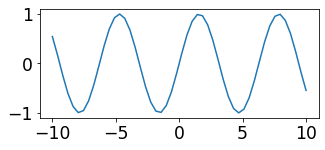

In [3]:
fig=plt.figure(figsize=(5,2))
ax=fig.add_subplot(1,1,1)
X=np.linspace(-10,10,50)
Y=np.sin(X)
ax.plot(X,Y)
plt.show()               

In [4]:
import matplotlib.offsetbox
props = dict(boxstyle='round',edgecolor="w",facecolor="w", alpha=0.5)

In [5]:
from datetime import datetime,date

In [6]:
#pip install fpdf
#from fpdf import FPDF

import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

In [7]:
today = date.today()
string_date=today.strftime("%Y-%m-%d")

In [8]:
string_date

'2022-04-05'

In [9]:
from iminuit import Minuit
import iminuit

In [10]:
iminuit.__version__

'2.2.0'

In [11]:
from astropy.io import fits
from spectractor import parameters
from spectractor.extractor.extractor import Spectractor
from spectractor.extractor.spectrum import Spectrum, detect_lines
from spectractor.extractor.spectrum import *
#from spectractor.extractor.spectroscopy import Lines, Line ,HALPHA, HBETA, O2_1, H2O_1,H2O_2
from spectractor.extractor.spectroscopy import Lines, Line ,HALPHA, HBETA, O2_1, H2O_1, ATMOSPHERIC_LINES
from spectractor.config import load_config
from spectractor import parameters
from spectractor.extractor.images import *
from scipy import ndimage, misc
from scipy.interpolate import interp1d

In [12]:
H2O_2 = Line(960, atmospheric=True, label=r'$H_2 O$', label_pos=[0.007, 0.02],width_bounds=[5, 30])  # libradtran paper fig.3, broad line

In [13]:
import requests
from requests.adapters import HTTPAdapter
from requests.packages.urllib3.util.retry import Retry

In [14]:
from time import sleep

In [15]:
from astropy.time import Time
import astropy.units as u

# Function

In [16]:
def file_tag_forsorting(filename):
    # m=re.findall('^Cor_holo4_003_.*([0-9][0-9][0-9][0-9]-[0-9][0-9]-[0-9][0-9]_.*)[.]fits$',filename)
    m = re.findall('^exposure_.*([0-9][0-9][0-9][0-9][0-9])_postisrccd.*', filename)
    if len(m)>0:
        return m[0]
    else:
        return None


In [17]:
def subdir_tag_forsorting(subdir):
    # m=re.findall('^Cor_holo4_003_.*([0-9][0-9][0-9][0-9]-[0-9][0-9]-[0-9][0-9]_.*)[.]fits$',filename)
    m = re.findall('.*([0-9][0-9][0-9][0-9][0-9])$', subdir)
    if len(m)>0:
        return m[0]
    else:
        return None


In [18]:
file_tag_forsorting('exposure_2022031600330_postisrccd.fits')

'00330'

In [19]:
subdir_tag_forsorting('2022031600330')

'00330'

# Config

In [20]:
# path index for each month
DATE="20220317"

In [21]:
version="v5.0"

In [22]:
# Choose the config filename

list_of_spectractorconfigfiles= ["auxtel_configA.ini","auxtel_configB.ini","auxtel_configC.ini","auxtel_configD.ini","auxtel_configE.ini","auxtel_configF.ini","auxtel_configG.ini","auxtel_configHb.ini"]
config_idx =7
configfilename= os.path.join("./config",list_of_spectractorconfigfiles[config_idx])
configdir = (list_of_spectractorconfigfiles[config_idx].split("_")[-1]).split(".") [0]


In [23]:
configdir 

'configHb'

# Path

In [24]:
HOSTCC=True

In [25]:
# Set path depending on which computer running (according HOSTCC)
if HOSTCC:
    path_auxtel="/sps/lsst/groups/auxtel"
    path_spectractor=os.path.join(path_auxtel,"softs/github/desc/Spectractor")
    path_spectractor_config=os.path.join(path_spectractor,"config")
    path_images=os.path.join(path_auxtel,"data/2022/holo/"+DATE)
    path_output_spectractor=os.path.join(path_auxtel,"data/2022/OutputSpectractor/holo/"+configdir+"/"+DATE)
    
else:
    #path_auxtel="/Users/dagoret/DATA/AuxTelData2021"
    path_auxtel="/Users/sylvie/DATA/AuxTelDATA2022/2022"
    #path_spectractor=os.path.join(path_auxtel,"/users/dagoret/MacOSX/github/LSST/Spectractor")
    path_spectractor=os.path.join(path_auxtel,"/Users/sylvie/MacOSX/GitHub/LSST/Spectractor")
    path_spectractor_config=os.path.join(path_spectractor,"config")
    #path_images=os.path.join(path_auxtel,"holo/quickLookExp_v2/"+DATE)
    path_images=os.path.join(path_auxtel,"holo/"+DATE)
    path_output_spectractor=os.path.join(path_auxtel,"OutputSpectractor/holo/"+configdir+"/"+DATE)
    #path_output_spectractor=os.path.join(path_auxtel,"holo/OutputSpectractor/"+DATE)
    

In [26]:
path_output_spectractor

'/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317'

In [27]:
! ls -l $path_output_spectractor

total 0
drwxrws--- 1 dagoret lsst 2 Apr  4 17:54 2022031700237
drwxrws--- 1 dagoret lsst 2 Apr  4 20:16 2022031700238
drwxrws--- 1 dagoret lsst 2 Apr  5 17:25 2022031700244
drwxrws--- 1 dagoret lsst 2 Apr  5 17:25 2022031700245
drwxrws--- 1 dagoret lsst 2 Apr  5 17:25 2022031700251
drwxrws--- 1 dagoret lsst 2 Apr  5 17:25 2022031700252
drwxrws--- 1 dagoret lsst 2 Apr  5 17:25 2022031700258
drwxrws--- 1 dagoret lsst 2 Apr  5 17:25 2022031700259
drwxrws--- 1 dagoret lsst 2 Apr  5 17:25 2022031700265
drwxrws--- 1 dagoret lsst 2 Apr  5 17:25 2022031700266
drwxrws--- 1 dagoret lsst 2 Apr  5 17:25 2022031700272
drwxrws--- 1 dagoret lsst 2 Apr  5 17:25 2022031700273
drwxrws--- 1 dagoret lsst 2 Apr  5 17:25 2022031700279
drwxrws--- 1 dagoret lsst 2 Apr  5 17:25 2022031700280
drwxrws--- 1 dagoret lsst 2 Apr  5 17:25 2022031700286
drwxrws--- 1 dagoret lsst 2 Apr  5 17:25 2022031700287
drwxrws--- 1 dagoret lsst 2 Apr  5 17:25 2022031700293
drwxrws--- 1 dagoret lsst 2 Apr  5 17:25 2022031700294
dr

In [28]:
# standard configuration for spectractor
#config = os.path.join(path_spectractor_config,"auxtel.ini")
#config=os.path.join("./config",configfilename)
config=configfilename
print(f">>>>> Spectractor configuration filename : {configfilename}")

>>>>> Spectractor configuration filename : ./config/auxtel_configHb.ini


## Logbook for file selection

In [29]:
# Logbook for scan data
filename_logbook='logbooks/auxtelholologbook_'+DATE+'_'+ version+'.csv'

In [30]:
df=pd.read_csv(filename_logbook,index_col=0)

In [31]:
pd.set_option('display.max_rows', None)

In [32]:
df

,index,date,path,file,num,object,filter,disperser,airmass,exposure,...,temperature,humidity,windspd,Obj-posXpix,Obj-posYpix,Dx,Dy,skip,run,quality
0,0,2022-03-18T00:51:03.112,/sps/lsst/groups/auxtel/data/2022/holo/20220317,exposure_2022031700237_postisrccd.fits,237,mu. Col,empty_1,holo4_003,1.114069,20.0,...,8.9,48.0,9.4,NaN,NaN,NaN,NaN,,NaN,NaN
1,1,2022-03-18T00:51:36.190,/sps/lsst/groups/auxtel/data/2022/holo/20220317,exposure_2022031700238_postisrccd.fits,238,mu. Col,empty_1,holo4_003,1.115188,20.0,...,8.9,48.0,9.4,NaN,NaN,NaN,NaN,,NaN,NaN
2,2,2022-03-18T00:54:30.463,/sps/lsst/groups/auxtel/data/2022/holo/20220317,exposure_2022031700244_postisrccd.fits,244,mu. Col,empty_1,holo4_003,1.121178,20.0,...,8.9,49.0,8.7,NaN,NaN,NaN,NaN,,NaN,NaN
3,3,2022-03-18T00:55:03.377,/sps/lsst/groups/auxtel/data/2022/holo/20220317,exposure_2022031700245_postisrccd.fits,245,mu. Col,empty_1,holo4_003,1.122325,20.0,...,8.8,49.0,7.5,NaN,NaN,NaN,NaN,,NaN,NaN
4,4,2022-03-18T00:58:01.707,/sps/lsst/groups/auxtel/data/2022/holo/20220317,exposure_2022031700251_postisrccd.fits,251,mu. Col,empty_1,holo4_003,1.128693,20.0,...,8.9,50.0,10.2,NaN,NaN,NaN,NaN,,NaN,NaN
5,5,2022-03-18T00:58:34.835,/sps/lsst/groups/auxtel/data/2022/holo/20220317,exposure_2022031700252_postisrccd.fits,252,mu. Col,empty_1,holo4_003,1.129892,20.0,...,8.9,50.0,10.2,NaN,NaN,NaN,NaN,,NaN,NaN
6,6,2022-03-18T01:01:32.859,/sps/lsst/groups/auxtel/data/2022/holo/20220317,exposure_2022031700258_postisrccd.fits,258,mu. Col,empty_1,holo4_003,1.136492,20.0,...,8.9,53.0,10.1,NaN,NaN,NaN,NaN,,NaN,NaN
7,7,2022-03-18T01:02:05.775,/sps/lsst/groups/auxtel/data/2022/holo/20220317,exposure_2022031700259_postisrccd.fits,259,mu. Col,empty_1,holo4_003,1.137732,20.0,...,8.9,52.0,10.4,NaN,NaN,NaN,NaN,,NaN,NaN
8,8,2022-03-18T01:05:03.839,/sps/lsst/groups/auxtel/data/2022/holo/20220317,exposure_2022031700265_postisrccd.fits,265,mu. Col,empty_1,holo4_003,1.144579,20.0,...,8.9,53.0,10.5,NaN,NaN,NaN,NaN,,NaN,NaN
9,9,2022-03-18T01:05:36.766,/sps/lsst/groups/auxtel/data/2022/holo/20220317,exposure_2022031700266_postisrccd.fits,266,mu. Col,empty_1,holo4_003,1.145874,20.0,...,8.9,53.0,10.5,NaN,NaN,NaN,NaN,,NaN,NaN


## Selection of input files

In [33]:
# Do not consider flag
#df_good=df[df["quality"]==1]

In [34]:
df_good=df
df_good["quality"] = 1

In [35]:
for spectra_file in df_good["file"]:
    print(spectra_file)

exposure_2022031700237_postisrccd.fits
exposure_2022031700238_postisrccd.fits
exposure_2022031700244_postisrccd.fits
exposure_2022031700245_postisrccd.fits
exposure_2022031700251_postisrccd.fits
exposure_2022031700252_postisrccd.fits
exposure_2022031700258_postisrccd.fits
exposure_2022031700259_postisrccd.fits
exposure_2022031700265_postisrccd.fits
exposure_2022031700266_postisrccd.fits
exposure_2022031700272_postisrccd.fits
exposure_2022031700273_postisrccd.fits
exposure_2022031700279_postisrccd.fits
exposure_2022031700280_postisrccd.fits
exposure_2022031700286_postisrccd.fits
exposure_2022031700287_postisrccd.fits
exposure_2022031700293_postisrccd.fits
exposure_2022031700294_postisrccd.fits
exposure_2022031700300_postisrccd.fits
exposure_2022031700301_postisrccd.fits
exposure_2022031700309_postisrccd.fits
exposure_2022031700310_postisrccd.fits
exposure_2022031700316_postisrccd.fits
exposure_2022031700317_postisrccd.fits
exposure_2022031700323_postisrccd.fits
exposure_2022031700324_po

## Selection of Spectractor output files

In [36]:
# total number of exposures
NBEXP=0
# total number of exposures without dir
NBEXPNODIR=0
# total number of exposures with dir
NBEXPWTHDIR=0
# total number of exposures with plots
NBEXPWTHPLT=0
# total number of exposures with spectra
NBEXPWTHSPEC=0

# list of exposures
LISTNUM=[]
# list of exposure without dir (not run spectraction)
LISTNUMNODIR=[]
# list of exposure with dir (spectraction has been run)
LISTNUMWTHDIR=[]
# list of exposures with plots (Spectractor has run up to some point)
LISTNUMWTHPLOTS=[]
# list of exposures with spectraction output (Spectractor has completed)
LISTNUMWTHSPECTR=[]

# list of selected spectra path
List_of_spectra_path=[]

In [37]:
list_of_files=os.listdir(path_output_spectractor)
list_of_files=sorted(list_of_files)


print("list of subdir found ",list_of_files)

for subdir in list_of_files:
    
    
    #tag = file_tag_forsorting(subdir)
    tag = subdir_tag_forsorting(subdir)
    
        
    print(tag)    
    #if tag is not None and int(tag)<317:
    #    continue
    if tag is None :
        continue
  
    
    
    fulldir=os.path.join(path_output_spectractor,subdir)



    if not os.path.isdir(fulldir):
        
        print("---------------------------------------------")
        print(subdir," \t  ",tag)
        print("{} is not a directory".format(subdir))
        

        NBEXPNODIR+=1


    else:

        
        print("---------------------------------------------")
        print(subdir," \t  ",tag)
        print("{} is a directory".format(subdir))

        tagname=subdir_tag_forsorting(subdir)
        print("tagname= {}".format(tagname))
        #targetname=file_target(subdir)
        #print("targetname= {}".format(targetname))
        



        NBEXP += 1
        LISTNUM.append(tagname)



        dir_plots=os.path.join(fulldir,"plots")
        dir_spectration = os.path.join(fulldir, "basespec")

        flag_empty1 = True
        flag_empty2 = True


        if os.path.isdir(dir_plots):
            if any(os.scandir(dir_plots)):
                print("dir_plots is not empty")
                NBEXPWTHPLT+=1
                LISTNUMWTHPLOTS.append(tagname)
                flag_empty1 = False

            else:
                print("dir_plots is empty")


        if os.path.isdir(dir_spectration):
            if any(os.scandir(dir_spectration)):
                print("dir_spectration is not empty")
                NBEXPWTHSPEC+=1
                LISTNUMWTHSPECTR.append(tagname)
                flag_empty2 = False
                List_of_spectra_path.append(dir_spectration)

            else:
                print("dir_spectration is empty")

        if flag_empty1 and flag_empty2 :
            NBEXPNODIR+=1
            LISTNUMNODIR.append(tagname)
        else:
            NBEXPWTHDIR += 1
            LISTNUMWTHDIR.append(tagname)



print("-----------------------------------------------------------------")


#LISTNUM=sorted(LISTNUM)
#LISTNUMNODIR=sorted(LISTNUMNODIR)
#LISTNUMWTHDIR=sorted(LISTNUMWTHDIR)
#LISTNUMWTHPLOTS=sorted(LISTNUMWTHPLOTS)
#LISTNUMWTHSPECTR=sorted(LISTNUMWTHSPECTR)
List_of_spectra_path=sorted(List_of_spectra_path)

print("Full list of Exposures : .......................{}".format(LISTNUM))
print("Full list of Exposures without output dir: .....{}".format(LISTNUMNODIR))
print("Full list of Exposures with output dir: ....... {}".format(LISTNUMWTHDIR))
print("Full list of Exposures with output plots: ..... {}".format(LISTNUMWTHPLOTS))
print("Full list of Exposures with output spectra: ....{}".format(LISTNUMWTHSPECTR))




print("Total number of exposures : .....................{}".format(NBEXP))
print("Total number of exposures without dir : .........{}".format(NBEXPNODIR))
print("Total number of exposures with dir :.............{}".format(NBEXPWTHDIR))
print("Total number of exposures with plots : ..........{}".format(NBEXPWTHPLT))
print("Total number of exposures with spectra: .........{}".format(NBEXPWTHSPEC))


list of subdir found  ['2022031700237', '2022031700238', '2022031700244', '2022031700245', '2022031700251', '2022031700252', '2022031700258', '2022031700259', '2022031700265', '2022031700266', '2022031700272', '2022031700273', '2022031700279', '2022031700280', '2022031700286', '2022031700287', '2022031700293', '2022031700294', '2022031700300', '2022031700301', '2022031700309', '2022031700310', '2022031700316', '2022031700317', '2022031700323', '2022031700324', '2022031700330', '2022031700331', '2022031700337', '2022031700338', '2022031700344', '2022031700345', '2022031700351', '2022031700352', '2022031700358', '2022031700359', '2022031700365', '2022031700366', '2022031700372', '2022031700373', '2022031700379', '2022031700380', '2022031700386', '2022031700387', '2022031700393', '2022031700394', '2022031700400', '2022031700401', '2022031700407', '2022031700408', '2022031700414', '2022031700415', '2022031700421', '2022031700422', '2022031700428', '2022031700429', '2022031700435', '2022031

In [38]:
#dir_spectra="outputs_reprocess"
print(List_of_spectra_path)

['/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700238/basespec', '/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700244/basespec', '/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700245/basespec', '/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700251/basespec', '/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700252/basespec', '/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700265/basespec', '/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700272/basespec', '/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700273/basespec', '/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700279/basespec', '/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700286/

In [39]:
config

'./config/auxtel_configHb.ini'

## Extraction of spectra

In [40]:
all_files_spectra = []
all_files_spectrogram = []
all_files_lines = []
all_files_table = []

# loop on topdir
for dir_spectra in List_of_spectra_path:
    for filename in os.listdir(dir_spectra):
        if re.search("_spectrum.fits$",filename):
            the_file_spectrum=os.path.join(dir_spectra,filename)
            all_files_spectra.append(the_file_spectrum)
            the_file_spectrogram=the_file_spectrum.replace("_spectrum","_spectrogram")
            all_files_spectrogram.append(the_file_spectrogram)
            the_file_lines=the_file_spectrum.replace("_spectrum.fits","_lines.csv")
            all_files_lines.append(the_file_lines)
            the_file_table=the_file_spectrum.replace("_spectrum.fits","_table.csv")
            all_files_table.append(the_file_table)
    

In [41]:
all_files_spectra[:3]

['/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700238/basespec/exposure_2022031700238_postisrccd_spectrum.fits',
 '/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700244/basespec/exposure_2022031700244_postisrccd_spectrum.fits',
 '/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700245/basespec/exposure_2022031700245_postisrccd_spectrum.fits']

In [42]:
all_files_spectrogram[:3]

['/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700238/basespec/exposure_2022031700238_postisrccd_spectrogram.fits',
 '/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700244/basespec/exposure_2022031700244_postisrccd_spectrogram.fits',
 '/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700245/basespec/exposure_2022031700245_postisrccd_spectrogram.fits']

In [43]:
all_files_lines[:3]

['/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700238/basespec/exposure_2022031700238_postisrccd_lines.csv',
 '/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700244/basespec/exposure_2022031700244_postisrccd_lines.csv',
 '/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700245/basespec/exposure_2022031700245_postisrccd_lines.csv']

In [44]:
all_files_table[:3] 

['/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700238/basespec/exposure_2022031700238_postisrccd_table.csv',
 '/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700244/basespec/exposure_2022031700244_postisrccd_table.csv',
 '/sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700245/basespec/exposure_2022031700245_postisrccd_table.csv']

## Selection of good spectra

In [45]:
all_good_spectra_spectrum_files = sorted(all_files_spectra)

In [46]:
N=len(all_good_spectra_spectrum_files)

# wavelength bin colors
jet = plt.get_cmap('jet')
cNorm = colors.Normalize(vmin=0, vmax=N)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)
all_colors = scalarMap.to_rgba(np.arange(N), alpha=1)

## All Spectra

0 ) exposure_2022031700238_postisrccd_spectrum.fits   /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700238/basespec/exposure_2022031700238_postisrccd_spectrum.fits
set date_obs to 2022-03-18T00:51:22.049
set expo to 20.0
set airmass to 1.11557476948966
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1753951396614214
set dec to -32.3064444444444
set hour_angle to 30.8762989508295
set temperature to 8.9
set pressure to 743.45
set humidity to 48.0
set lambda_ref to 626.6801216985461
set parallactic_angle to 93.8012496664173


/sps/lsst/groups/auxtel/softs/utils/anaconda3/lib/python3.8/site-packages/secretstorage/dhcrypto.py:16: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/sps/lsst/groups/auxtel/softs/utils/anaconda3/lib/python3.8/site-packages/secretstorage/util.py:25: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes


target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ...  Z_VALUE  SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                           
--------- ------------- ------------- ... --------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ... 0.0003640                1
1 ) exposure_2022031700244_postisrccd_spectrum.fits   /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700244/basespec/exposure_2022031700244_postisrccd_spectrum.fits
set date_obs to 2022-03-18T00:54:16.312
set expo to 20.0
set airmass to 1.121576965054115
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1741806116248446
set dec to -32.3064444444444
set hour_angle to 31.60492174100415
set temperature to 8.9
set pressure to 743.45
set humidity to 49.0
set lambda_ref to 626.883564656571
set parallactic_angle to 94.10618686949074
target_name = mu.col, Selected object name for Simbad : m

/tmp/ipykernel_13858/916156364.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig=plt.figure(figsize=(16,4))


set date_obs to 2022-03-18T02:04:16.794
set expo to 20.0
set airmass to 1.33727547076682
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1388486262435704
set dec to -32.3064444444444
set hour_angle to 49.15879882143194
set temperature to 8.5
set pressure to 743.45
set humidity to 58.0
set lambda_ref to 628.5424256920012
set parallactic_angle to 100.7251843777299
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_21 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1
21 ) exposure_2022031700352_postisrccd_spectrum.fits   /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700352/basespec/exposure_2022031700352_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:04:49.712
set expo to 

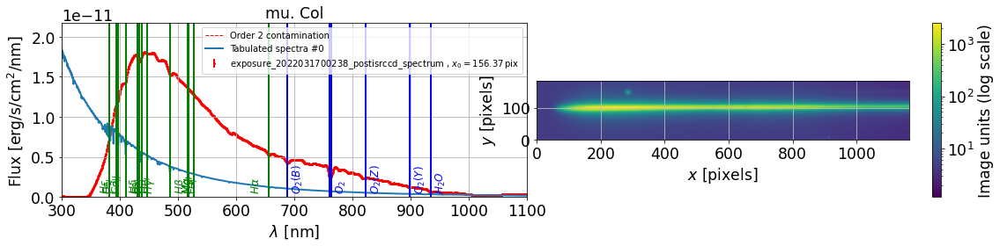

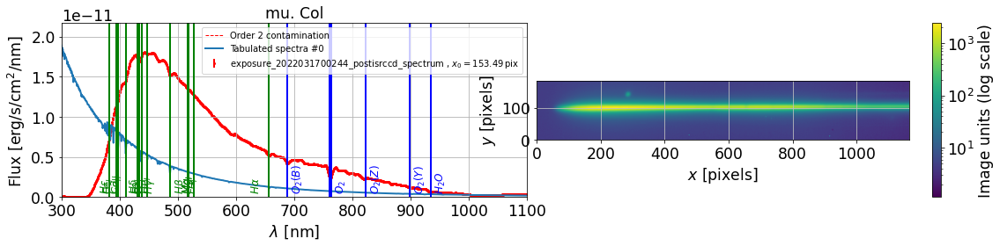

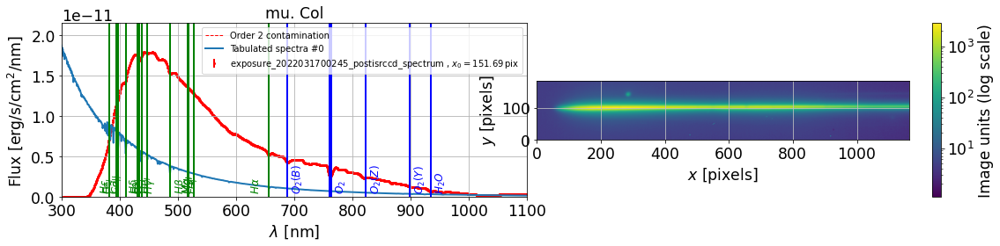

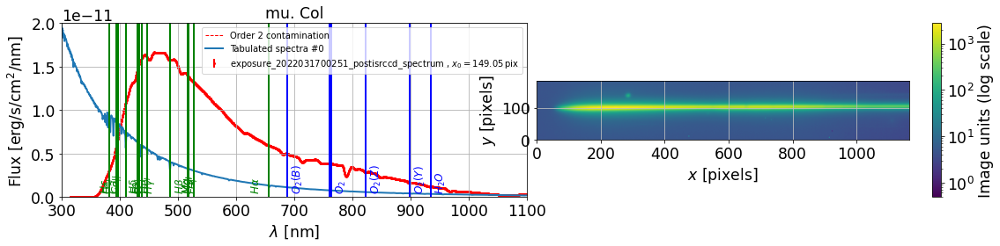

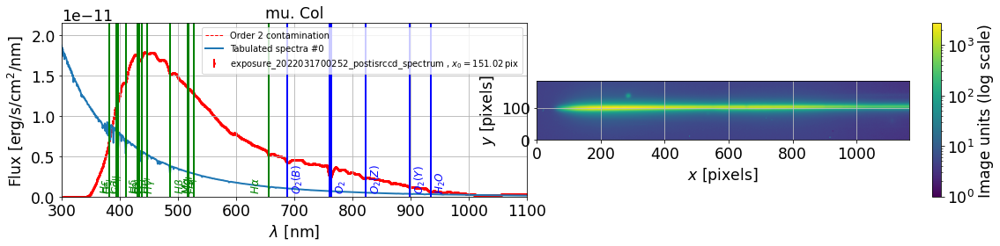

...

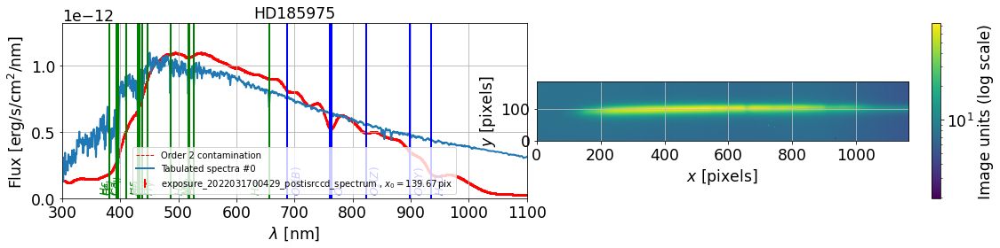

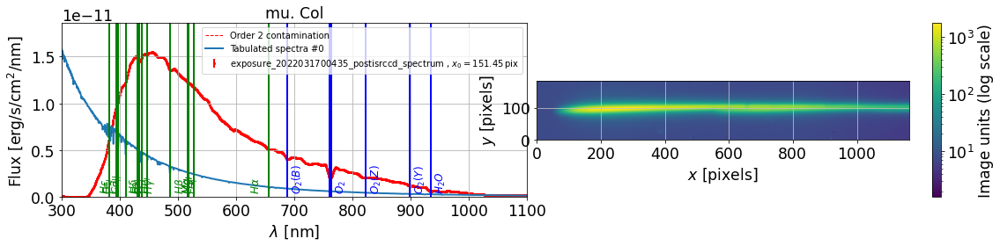

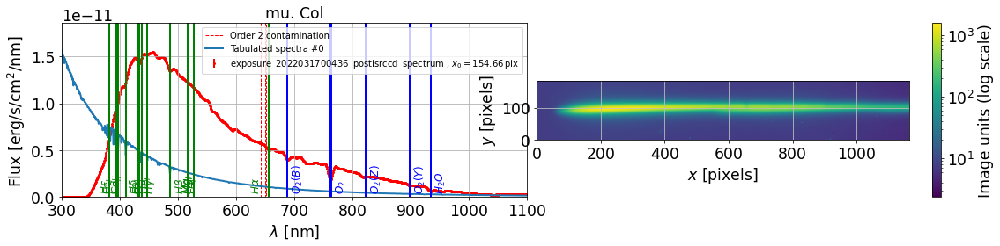

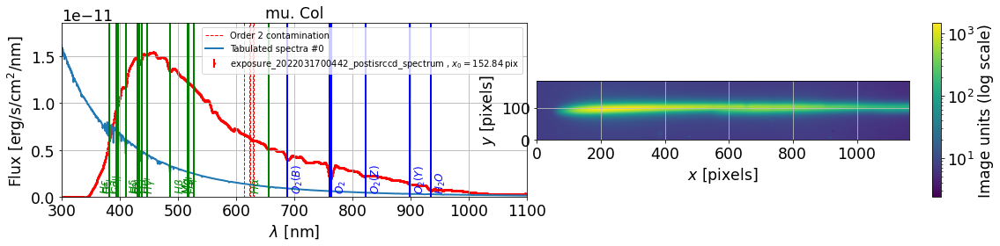

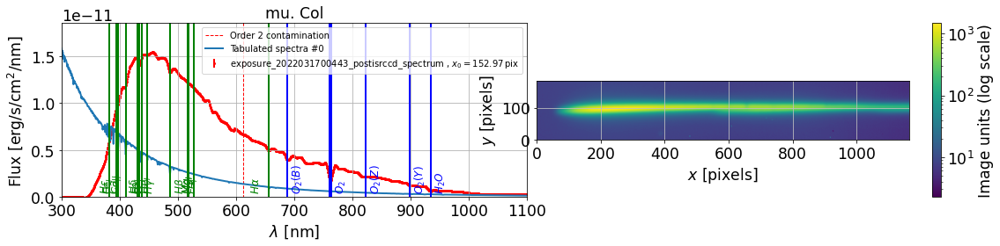

In [47]:
parameters.DISPLAY=True

infos = []
all_lambdas=[]
all_data=[]
all_num=[]
all_figs = []

idx=0
for fullfilename in all_good_spectra_spectrum_files:
    
    filename = os.path.basename(fullfilename)
    print(idx,")",filename," ",fullfilename)
    
    
    fig=plt.figure(figsize=(16,4))
    ax1 = fig.add_subplot(1, 2, 1)
    
    filename= os.path.basename(fullfilename)
    tag=file_tag_forsorting(filename.split(".")[0])
    all_num.append(tag)
    
   
     
    s=Spectrum(fullfilename, config=config,fast_load=False)
    label=filename.split('.')[0]+" "
    s.plot_spectrum(ax=ax1,force_lines=True,label=label)
    
    all_lambdas.append(s.lambdas)
    all_data.append(s.data)
    
    ax2 = fig.add_subplot(1, 2, 2)
    
    fullfilename2=all_files_spectrogram[idx]
    
    s.load_spectrogram(fullfilename2)
    s.plot_spectrogram(ax=ax2,scale="log")
    
    
    infos.append([idx,s.target.label,s.date_obs,s.airmass,s.temperature,s.pressure,s.humidity])
    
    
    plt.show()
    all_figs.append(fig)
    
    idx+=1
    

## Save figures in a pdf filename

In [48]:
multipage_pdf_file = f'multipage_pdf_holo_{DATE}_{configdir}.pdf'
# gerate a multipage pdf:
with PdfPages(multipage_pdf_file) as pdf:
    for fig in all_figs:
        pdf.savefig(fig)
        plt.close()

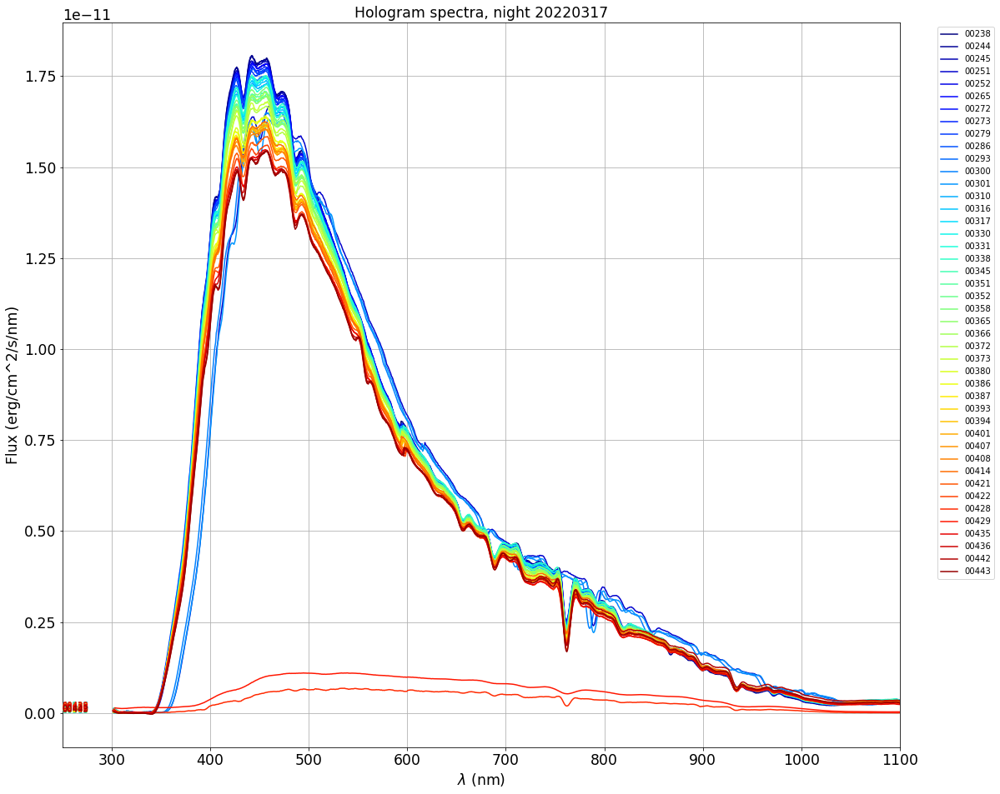

In [49]:
fig=plt.figure(figsize=(18,16))
ax=fig.add_subplot(1,1,1)

idx=0
for fullfilename in all_good_spectra_spectrum_files:
    
    filename= os.path.basename(fullfilename)
         
    #s=Spectrum(fullfilename, config=config,fast_load=False)
    label=filename.split('.')[0]+" "
    label=all_num[idx]
    
    
    
    #delta=idx*1.0e-13
    delta=0
    
    if label not in ["100284","100276","100289","100291"] :
        ax.plot(all_lambdas[idx],all_data[idx]+delta,label=label,color=all_colors[idx])
        plt.text(250.,all_data[idx][0]+delta, f'{label}',color=all_colors[idx],fontsize=10)
    
    idx+=1
ax.set_xlabel("$\\lambda$ (nm)")
ax.set_ylabel("Flux (erg/cm^2/s/nm)")
ax.set_xlim(250.,1100)
ax.grid()
ax.legend(bbox_to_anchor=(1.04, 1), prop={'size': 10}, loc='upper left')

title = f"Hologram spectra, night {DATE}"
ax.set_title(title)
plt.show()
    

## View one spectrum

1 ) exposure_2022031700244_postisrccd_spectrum.fits   /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700244/basespec/exposure_2022031700244_postisrccd_spectrum.fits
set date_obs to 2022-03-18T00:54:16.312
set expo to 20.0
set airmass to 1.121576965054115
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1741806116248446
set dec to -32.3064444444444
set hour_angle to 31.60492174100415
set temperature to 8.9
set pressure to 743.45
set humidity to 49.0
set lambda_ref to 626.883564656571
set parallactic_angle to 94.10618686949074
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_45 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


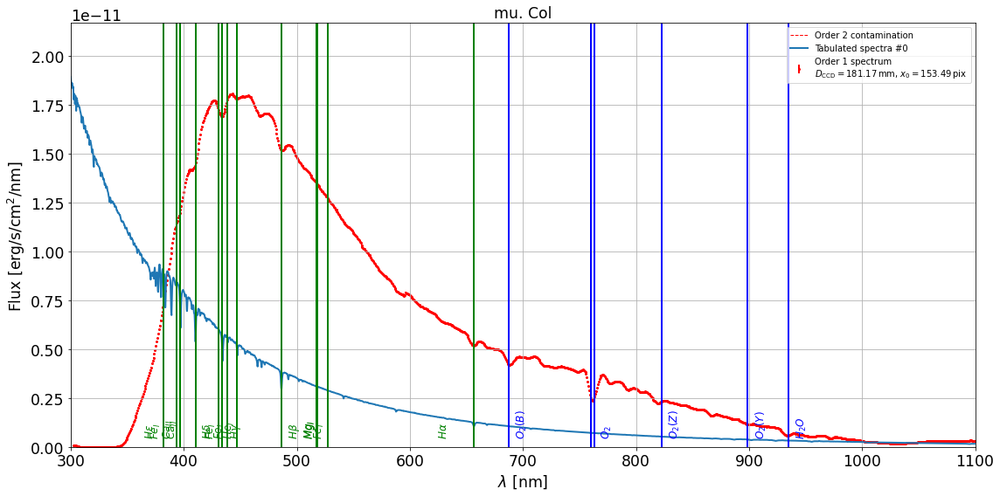

In [50]:
idx=1

fullfilename = all_good_spectra_spectrum_files[idx]
    
filename = os.path.basename(fullfilename)
print(idx,")",filename," ",fullfilename)
    
    
fig=plt.figure(figsize=(16,8))
ax1 = fig.add_subplot(1, 1, 1)
    
filename= os.path.basename(fullfilename)
tag=file_tag_forsorting(filename.split(".")[0])
all_num.append(tag)
    
   
     
s=Spectrum(fullfilename, config=config,fast_load=False)
label=filename.split('.')[0]+" "
#s.plot_spectrum(ax=ax1,force_lines=True,label=label)
s.plot_spectrum(ax=ax1,force_lines=True)
    
    
#ax2 = fig.add_subplot(1, 2, 2)
    
#fullfilename2=all_files_spectrogram[idx]
    
#s.load_spectrogram(fullfilename2)
#s.plot_spectrogram(ax=ax2,scale="log")
    

plt.show()
    

In [51]:
def PlotSpectra(all_wl,all_spec,all_tag,delta=0, 
                thetitle="Hologram, spectrum night 2022-03-16", 
                thexlabel="$\\lambda$ (nm)",theylabel="Flux (erg/cm^2/s/nm)",figsize=(14,8)):
    """
    """
    
    NN=len(all_wl)
    
    # wavelength bin colors
    jet = plt.get_cmap('jet')
    cNorm = colors.Normalize(vmin=0, vmax=NN)
    scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)
    all_colors = scalarMap.to_rgba(np.arange(NN), alpha=1)
    
    
    fig=plt.figure(figsize=figsize)
    ax=fig.add_subplot(1,1,1)
    
    idx=0
    for idx in range(NN):
        
        label=all_tag[idx]
        ax.plot(all_wl[idx],all_spec[idx]+delta,label=label,color=all_colors[idx])
        if delta !=0:
            plt.text(250.,all_spec[idx][0]+delta, f'{label}',color=all_colors[idx],fontsize=10)
        
    ax.set_xlabel(thexlabel)
    ax.set_ylabel(theylabel)
    ax.set_xlim(250.,1100)
    ax.grid()
    ax.legend(bbox_to_anchor=(1.04, 1), prop={'size': 10}, loc='upper left')
    ax.set_title(thetitle)
    plt.show()
        
    
    

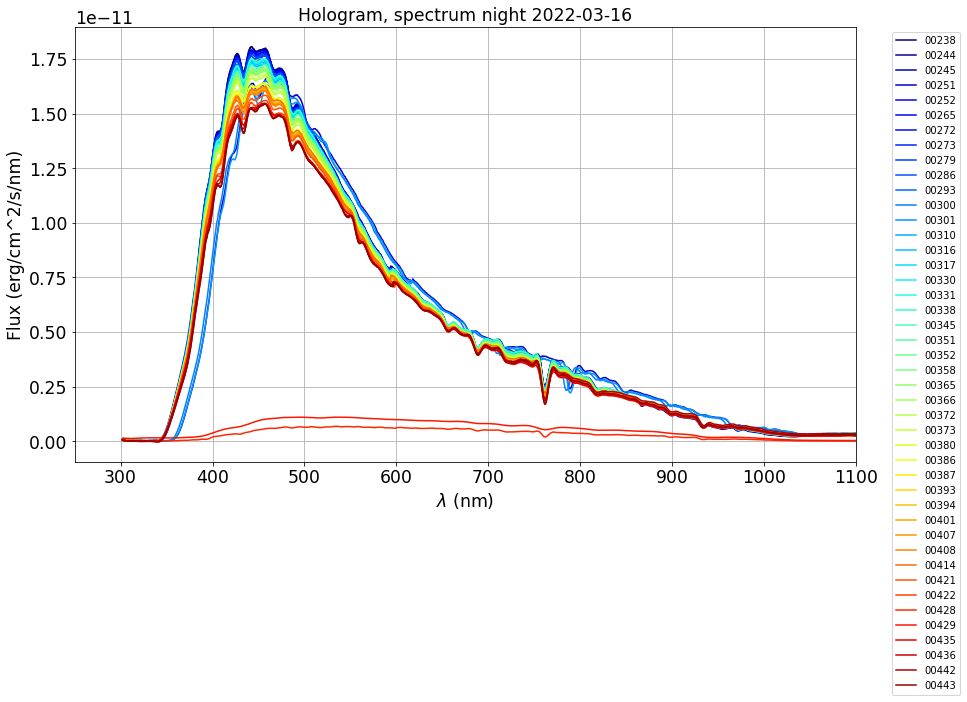

In [52]:
PlotSpectra(all_lambdas,all_data,all_num)

In [53]:
def PlotSpectraBoth(all_wl,all_spec,all_tag,delta=0, 
                thetitle="Hologram, spectrum", 
                thexlabel="$\\lambda$ (nm)",theylabel="Flux (erg/cm^2/s/nm)",figsize=(12,12)):
    """
    """
    
    NN=len(all_wl)
    
    # wavelength bin colors
    jet = plt.get_cmap('jet')
    cNorm = colors.Normalize(vmin=0, vmax=NN)
    scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)
    all_colors = scalarMap.to_rgba(np.arange(NN), alpha=1)
    
    
    fig=plt.figure(figsize=figsize)
    
    gs = gridspec.GridSpec(2, 1,height_ratios=[1, 3] ,figure=fig)
    
    #ax=fig.add_subplot(2,1,1)
    ax=fig.add_subplot(gs[0,0])
    
    idx=0
    delta=0
    for idx in range(NN):
        
        label=all_tag[idx]
        ax.plot(all_wl[idx],all_spec[idx]+delta,label=label,color=all_colors[idx])
        if delta !=0:
            ax.plot(all_lambdas[idx],all_data[idx]+delta,label=label,color=all_colors[idx])
            plt.text(250.,all_spec[idx][0]+delta, f'{label}',color=all_colors[idx],fontsize=10)
            
        
    #ax.set_xlabel(thexlabel)
    ax.set_ylabel(theylabel)
    ax.set_xlim(250.,1100)
    ax.grid()
    #ax.legend(bbox_to_anchor=(1.04, 1), prop={'size': 10}, loc='upper left')
    ax.set_title("superimposed spectra")
    
    #ax=fig.add_subplot(2,1,2)
    ax=fig.add_subplot(gs[1,0])
    
    
    idx=0
    for idx in range(NN):
        
        delta=idx*0.5e-13
        
        label=all_tag[idx]
        
        if delta ==0:
            
            ax.plot(all_wl[idx],all_spec[idx]+delta,label=label,color=all_colors[idx])
            plt.text(250.,all_spec[idx][0]+delta, f'{label}',color=all_colors[idx],fontsize=10)
        elif delta !=0:
            plt.text(250.,all_spec[idx][0]+delta, f'{label}',color=all_colors[idx],fontsize=10)
            ax.plot(all_wl[idx],all_spec[idx]+delta,label=label,color=all_colors[idx])
        
    ax.set_xlabel(thexlabel)
    ax.set_ylabel(theylabel)
    ax.set_xlim(250.,1100)
    ax.grid()
    #ax.legend(bbox_to_anchor=(1.04, 1), prop={'size': 10}, loc='upper left')
    ax.set_title("shifted spectra")
    
    
    plt.suptitle(thetitle,y=0.95,fontsize=20,fontweight="bold")
    #plt.tight_layout()
    plt.show()
        
    
    

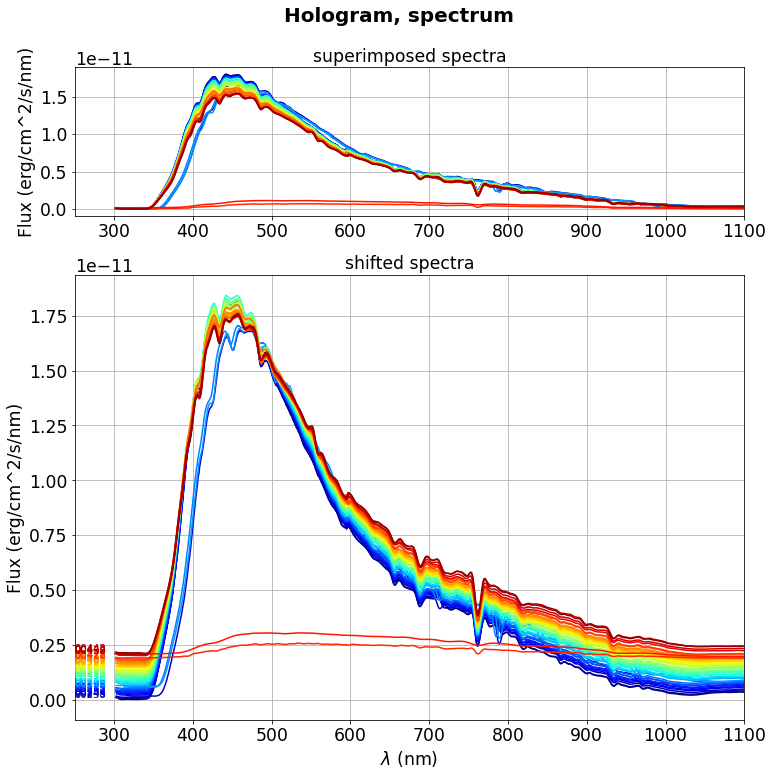

In [54]:
title = f"Hologram spectra {DATE}"
PlotSpectraBoth(all_lambdas,all_data,all_num)

## Info

In [55]:
df_infos=pd.DataFrame(infos,columns=["idx","object","date_obs","airmass","temperature","pressure","humidity"])

In [56]:
df_infos.set_index('idx',inplace=True)

In [57]:
all_reftime=[ (Time(tt)-Time( df_infos["date_obs"].values[0])).to_value(u.hr) for tt in df_infos["date_obs"].values ]

In [58]:
all_reftime=np.array(all_reftime)

In [59]:
df_infos["reftime"]=all_reftime

In [60]:
df_infos["eqw_h2o"] = np.nan
df_infos["eqw_o2"] = np.nan
df_infos["eqw_o2_spec"] = np.nan

In [61]:
df_infos

,object,date_obs,airmass,temperature,pressure,humidity,reftime,eqw_h2o,eqw_o2,eqw_o2_spec
idx,,,,,,,,,,
0,mu. Col,2022-03-18T00:51:22.049,1.115575,8.9,743.45,48.0,0.000000,NaN,NaN,NaN
1,mu. Col,2022-03-18T00:54:16.312,1.121577,8.9,743.45,49.0,0.048406,NaN,NaN,NaN
2,mu. Col,2022-03-18T00:54:49.235,1.122727,8.8,743.40,49.0,0.057552,NaN,NaN,NaN
3,mu. Col,2022-03-18T00:57:47.565,1.129107,8.9,743.40,50.0,0.107088,NaN,NaN,NaN
4,mu. Col,2022-03-18T00:58:20.709,1.130309,8.9,743.40,50.0,0.116294,NaN,NaN,NaN
5,mu. Col,2022-03-18T01:04:49.716,1.145030,8.9,743.30,53.0,0.224352,NaN,NaN,NaN
6,mu. Col,2022-03-18T01:08:18.080,1.153339,8.9,743.30,51.0,0.282231,NaN,NaN,NaN
7,mu. Col,2022-03-18T01:08:50.992,1.154683,8.9,743.35,51.0,0.291373,NaN,NaN,NaN
8,mu. Col,2022-03-18T01:11:46.031,1.161939,8.9,743.40,53.0,0.339995,NaN,NaN,NaN


In [62]:
NN = len(df_infos)

## Equivalent width

In [63]:
from astropy import units as u
from astropy.visualization import quantity_support

quantity_support()  # for getting units on the axes below  

<astropy.visualization.units.quantity_support.<locals>.MplQuantityConverter at 0x7fa4f7f55460>

In [64]:
from specutils import Spectrum1D
from specutils.fitting import fit_generic_continuum,fit_continuum
from specutils import SpectralRegion
from specutils.analysis import equivalent_width
from astropy.modeling import models
from specutils.manipulation import extract_region

In [65]:
IDXSEL=1
filename_SEL=all_good_spectra_spectrum_files[IDXSEL]
filename_spectrogram_SEL=filename_SEL.replace("_spectrum","_spectrogram")
fullfilename_SEL = os.path.join(dir_spectra,filename_SEL)
fullfilename_spectrogram_SEL = fullfilename_SEL.replace("_spectrum","_spectrogram")
thetitle=str(IDXSEL)+") "+filename_SEL

In [66]:
s=Spectrum(fullfilename_SEL, config=config)
s.load_spectrogram(fullfilename_spectrogram_SEL) 

set date_obs to 2022-03-18T00:54:16.312
set expo to 20.0
set airmass to 1.121576965054115
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1741806116248446
set dec to -32.3064444444444
set hour_angle to 31.60492174100415
set temperature to 8.9
set pressure to 743.45
set humidity to 49.0
set lambda_ref to 626.883564656571
set parallactic_angle to 94.10618686949074
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_46 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


In [67]:
lines = Lines([O2_1,H2O_1,H2O_2],atmospheric_lines=True, redshift=0, emission_spectrum=False)

In [68]:
s.lines = lines

In [69]:
lambdas = np.arange(300,1000,1)
fwhm_func = interp1d(lambdas, 0.01 * lambdas)

In [70]:
#global_chisq = detect_lines(lines, s.lambdas, s.data, s.err, fwhm_func=fwhm_func)

In [71]:
lamb = 10*s.lambdas * u.AA 
flux = s.data * u.Unit('erg cm-2 s-1 AA-1')/10. 
fluxerr = s.err * u.Unit('erg cm-2 s-1 AA-1')/10. 
spec = Spectrum1D(spectral_axis=lamb, flux=flux)
specerr = Spectrum1D(spectral_axis=lamb, flux=fluxerr)

In [72]:
def ComputeEquivWidth(spec,wlmin,wlmax,wlminline,wlmaxline,flag_plot=True,ax1=None,ax2=None):
    """
    
    ComputeEquivWidth(spec,wlmin,wlmax,wlminline,wlmaxline,flag_plot=True)
    
    - input :
    
    
    - output :
    
    """
            
    # region used to fit bacgroud        
    sub_region = SpectralRegion(wlmin , wlmax)
    # line region to remove background
    line_region = SpectralRegion(wlminline , wlmaxline)
    
    # region where one extract the spectrum
    sub_spectrum = extract_region(spec, sub_region)
    
    # initialisaition of linear model
    g_init = models.Linear1D(slope=0,intercept=1e-12)
    
    # fit on sub-spectrum
    g1_fit = fit_generic_continuum(sub_spectrum,model=g_init,exclude_regions=[line_region])
    # fit by keeping the whole spectrum , but fitting on hte relevant part of the spectrum
    g2_fit = fit_continuum(spec,model=g_init,window=sub_region,exclude_regions=[line_region])
    
    
    y_continuum_fitted1 = g1_fit(sub_spectrum.spectral_axis)
    y_continuum_fitted2 = g2_fit(spec.spectral_axis)
    
    # normalize the spectrum
    cont_norm_spec = spec/ y_continuum_fitted2 
    
    eqw1=equivalent_width(cont_norm_spec, regions=line_region) 
    eqw2=equivalent_width(cont_norm_spec, regions=sub_region)  
    
    
    if flag_plot:
        
        YMIN=spec.flux.min()
        YMAX=1.2*spec.flux.max()
        
        eqw_str1="$Eqw_1$ = {:2.2f} $\AA$ ".format(eqw1.value)
        eqw_str2="$Eqw_2$ = {:2.2f} $\AA$ ".format(eqw2.value)
    
    
        eqw_str='\n'.join((
        r'{}'.format(eqw_str1),
        r'{}'.format(eqw_str2)))
        
        if ax1==None: 
            f, ax1 = plt.subplots(figsize=(8,4))
            
        ax1.plot(spec.spectral_axis, spec.flux,'k-')  
        ax1.plot(sub_spectrum.spectral_axis, y_continuum_fitted1,'r-.',label="fit region")  
        ax1.plot(spec.spectral_axis, y_continuum_fitted2,'b:',label="extrapolated fit continuum")  
        ax1.set_title("Local continuum fitting")  
        ax1.grid(True)  
        ax1.legend()
        ax1.axvline(wlminline,color='r')
        ax1.axvline(wlmaxline,color="r")
        ax1.axvline(wlmin,color='g')
        ax1.axvline(wlmax,color="g")
        ax1.set_ylim(YMIN,YMAX)
        
        
        if ax2==None:
            f, ax2 = plt.subplots(figsize=(8,4)) 
            
            
        ax2.plot(spec.spectral_axis, cont_norm_spec.flux,'k-')  
        ax2.set_title("Equivalent width")  
        ax2.grid(True)  
        ax2.legend()
        ax2.axvline(wlminline,color='r')
        ax2.axvline(wlmaxline,color="r")
        ax2.axvline(wlmin,color='g')
        ax2.axvline(wlmax,color="g")
        ax2.set_ylim(0,2)
        ax2.text(0.05, 0.95, eqw_str, transform=ax2.transAxes, fontsize=12,verticalalignment='top', bbox=props)
        
    return eqw1.value,eqw2.value     


In [73]:
def ComputeEquivWidth_bootstrap(spec,specerr,wlmin,wlmax,wlminline,wlmaxline,NN=20,flag_plot=True,ax1=None,ax2=None):
    """
    
    ComputeEquivWidth_bootstrap(spec,specerr,wlmin,wlmax,wlminline,wlmaxline)
    
    - input :
    
    
    - output :
    
    """
    
    # region used to fit bacgroud        
    sub_region = SpectralRegion(wlmin , wlmax)
    # line region to remove background
    line_region = SpectralRegion(wlminline , wlmaxline)
         
    
    # region used to fit bacgroud        
    sub_region = SpectralRegion(wlmin , wlmax)
    # line region to remove background
    line_region = SpectralRegion(wlminline , wlmaxline)
    
    # region where one extract the spectrum
    sub_spectrum = extract_region(spec, sub_region)
    
    # initialisaition of linear model
    g_init = models.Linear1D(slope=0,intercept=1e-12)
    
    # fit on sub-spectrum
    g1_fit = fit_generic_continuum(sub_spectrum,model=g_init,exclude_regions=[line_region])
    # fit by keeping the whole spectrum , but fitting on hte relevant part of the spectrum
    g2_fit = fit_continuum(spec,model=g_init,window=sub_region,exclude_regions=[line_region])
    
    
    y_continuum_fitted1 = g1_fit(sub_spectrum.spectral_axis)
    y_continuum_fitted2 = g2_fit(spec.spectral_axis)
    
    # normalize the spectrum
    cont_norm_spec = spec/ y_continuum_fitted2 
       
    eqw10=equivalent_width(cont_norm_spec, regions=line_region).value 
    eqw20=equivalent_width(cont_norm_spec, regions=sub_region).value 
       
    # Bootstrap
    
    
    eqw1_set=np.zeros(NN)
    eqw2_set=np.zeros(NN)
    size=len(specerr.flux)
    
    # loop on trials 
    for idx in np.arange(NN):
        
        # random generator for errors
        s = np.random.normal(0, 1, size)
        
        # new flux
        newspec = Spectrum1D(spectral_axis=spec.spectral_axis, flux=spec.flux+specerr.flux*s)
              
    
        # region where one extract the spectrum
        sub_spectrum = extract_region(newspec, sub_region)
    
        # initialisaition of linear model
        g_init = models.Linear1D(slope=0,intercept=1e-12)
    
        # fit on sub-spectrum
        g1_fit = fit_generic_continuum(sub_spectrum,model=g_init,exclude_regions=[line_region])
        # fit by keeping the whole spectrum , but fitting on hte relevant part of the spectrum
        g2_fit = fit_continuum(newspec,model=g_init,window=sub_region,exclude_regions=[line_region])
    
    
        y_continuum_fitted1 = g1_fit(sub_spectrum.spectral_axis)
        y_continuum_fitted2 = g2_fit(newspec.spectral_axis)
    
        # normalize the spectrum
        cont_norm_spec = newspec/ y_continuum_fitted2 
    
    
        eqw1=equivalent_width(cont_norm_spec, regions=line_region) 
        eqw2=equivalent_width(cont_norm_spec, regions=sub_region) 
        
        
        eqw1_set[idx]=eqw1.value
        eqw2_set[idx]=eqw2.value
        
     
    eqw1_std=eqw1_set.std()
    eqw2_std=eqw2_set.std()
    
    
    if flag_plot:
        
        YMIN=spec.flux.min()
        YMAX=1.2*spec.flux.max()
        
        eqw_str1="$Eqw_1$ = {:2.2f} $\pm$ {:2.2f} $\AA$ ".format(eqw10,eqw1_std)
        eqw_str2="$Eqw_2$ = {:2.2f} $\pm$ {:2.2f} $\AA$ ".format(eqw20,eqw2_std)
    
    
        eqw_str='\n'.join((
        r'{}'.format(eqw_str1),
        r'{}'.format(eqw_str2)))
        
        if ax1==None: 
            f, ax1 = plt.subplots(figsize=(8,4))
            
        ax1.plot(spec.spectral_axis, spec.flux,'k-')  
        ax1.plot(sub_spectrum.spectral_axis, y_continuum_fitted1,'r-.',label="fit region")  
        ax1.plot(spec.spectral_axis, y_continuum_fitted2,'b:',label="extrapolated fit continuum")  
        ax1.set_title("Local continuum fitting")  
        ax1.grid(True)  
        ax1.legend()
        ax1.axvline(wlminline,color='r')
        ax1.axvline(wlmaxline,color="r")
        ax1.axvline(wlmin,color='g')
        ax1.axvline(wlmax,color="g")
        ax1.set_ylim(YMIN,YMAX)
        
        
        if ax2==None:
            f, ax2 = plt.subplots(figsize=(8,4)) 
            
            
        ax2.plot(spec.spectral_axis, cont_norm_spec.flux,'k-')  
        ax2.set_title("Equivalent width")  
        ax2.grid(True)  
        ax2.legend()
        ax2.axvline(wlminline,color='r')
        ax2.axvline(wlmaxline,color="r")
        ax2.axvline(wlmin,color='g')
        ax2.axvline(wlmax,color="g")
        ax2.set_ylim(0,2)
        ax2.text(0.05, 0.95, eqw_str, transform=ax2.transAxes, fontsize=12,verticalalignment='top', bbox=props)
               
        
    return eqw10,eqw20,eqw1_set,eqw2_set     


### O2 line

In [74]:
wlmin=10*(O2_1.wavelength-30)*u.AA
wlmax=10*(O2_1.wavelength+30)*u.AA
wlminline=10*(O2_1.wavelength-10)*u.AA
wlmaxline=10*(O2_1.wavelength+10)*u.AA

2022-04-05 22:33:13  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


Text(0.5, 0.98, '1) /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700244/basespec/exposure_2022031700244_postisrccd_spectrum.fits')

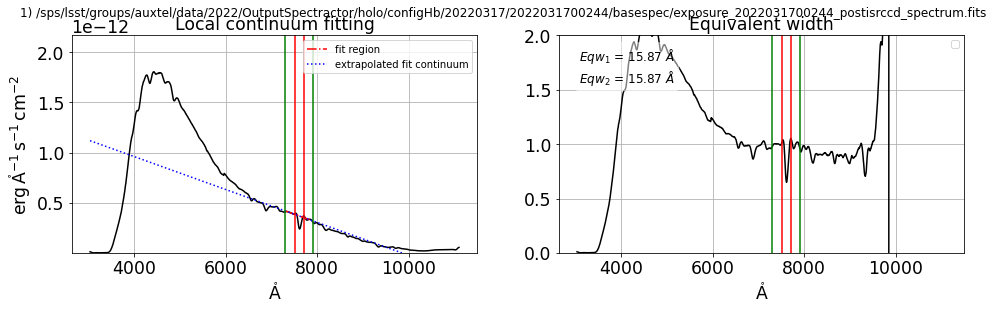

In [75]:
fig=plt.figure(figsize=(16,4))
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)
eq1,eq2=ComputeEquivWidth(spec,wlmin,wlmax,wlminline,wlmaxline,flag_plot=True,ax1=ax1,ax2=ax2)
plt.suptitle(thetitle)

2022-04-05 22:33:15  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


Text(0.5, 0.98, '1) /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700244/basespec/exposure_2022031700244_postisrccd_spectrum.fits')

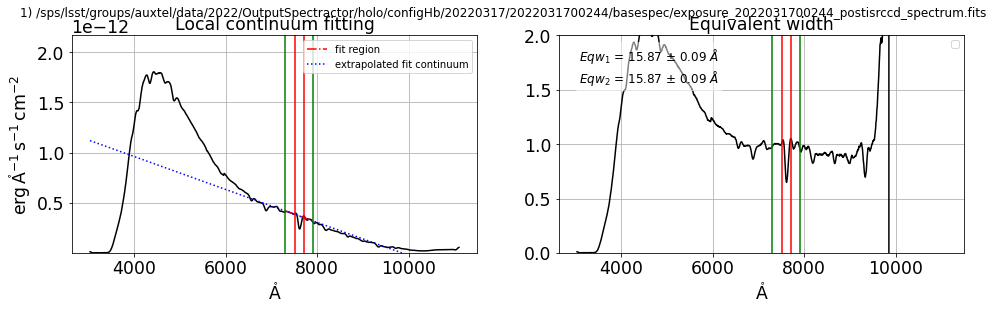

In [76]:
fig=plt.figure(figsize=(16,4))
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)
eqw10,eqw20,eq1_set,eq2_set=ComputeEquivWidth_bootstrap(spec,specerr,wlmin,wlmax,wlminline,wlmaxline,NN=30,flag_plot=True,ax1=ax1,ax2=ax2)
plt.suptitle(thetitle)


Text(0.5, 0.98, '1) /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700244/basespec/exposure_2022031700244_postisrccd_spectrum.fits')

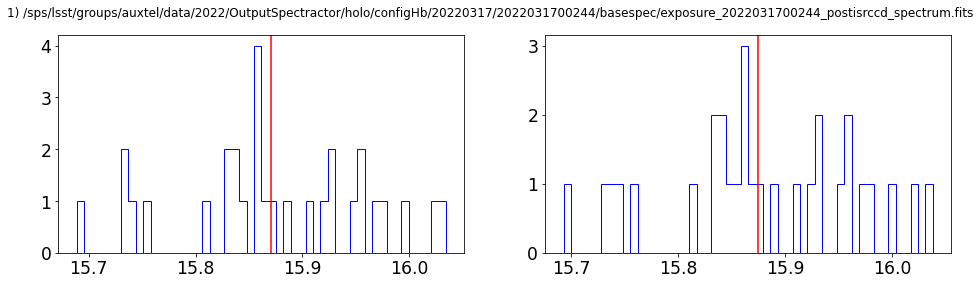

In [77]:
fig=plt.figure(figsize=(16,4))
ax1 = fig.add_subplot(1, 2, 1)
ax1.hist(eq1_set,bins=50,histtype='step',color='b');
ax1.axvline(eqw10,color='r')
ax2 = fig.add_subplot(1, 2, 2)
ax2.hist(eq2_set,bins=50,histtype='step',color="b");
ax2.axvline(eqw20,color='r')
plt.suptitle(thetitle)

### H2O line

In [78]:
wlmin=10*(H2O_1.wavelength-30)*u.AA
wlmax=10*(H2O_2.wavelength+30)*u.AA
wlminline=10*(H2O_1.wavelength-12)*u.AA
wlmaxline=10*(H2O_2.wavelength+10)*u.AA

In [79]:
lamb = 10*s.lambdas * u.AA 
flux = s.data * u.Unit('erg cm-2 s-1 AA-1')/10. 
fluxerr = s.err * u.Unit('erg cm-2 s-1 AA-1')/10. 
spec = Spectrum1D(spectral_axis=lamb, flux=flux)
specerr = Spectrum1D(spectral_axis=lamb, flux=fluxerr)


2022-04-05 22:33:58  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


Text(0.5, 0.98, '1) /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700244/basespec/exposure_2022031700244_postisrccd_spectrum.fits')

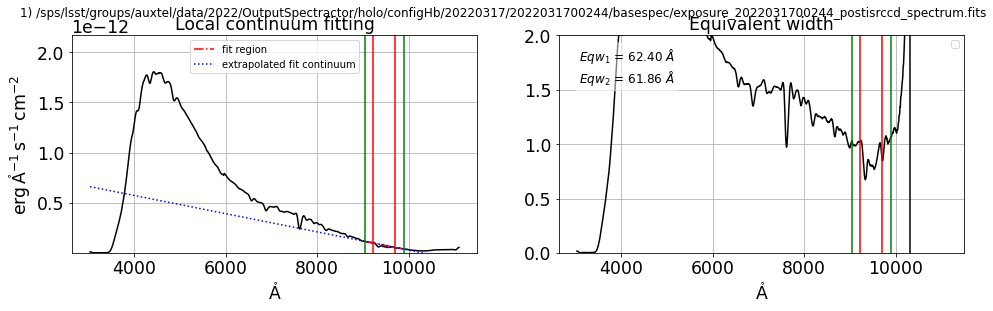

In [80]:
fig=plt.figure(figsize=(16,4))
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)
ComputeEquivWidth(spec,wlmin,wlmax,wlminline,wlmaxline,flag_plot=True,ax1=ax1,ax2=ax2)
plt.suptitle(thetitle)

2022-04-05 22:33:59  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


Text(0.5, 0.98, '1) /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700244/basespec/exposure_2022031700244_postisrccd_spectrum.fits')

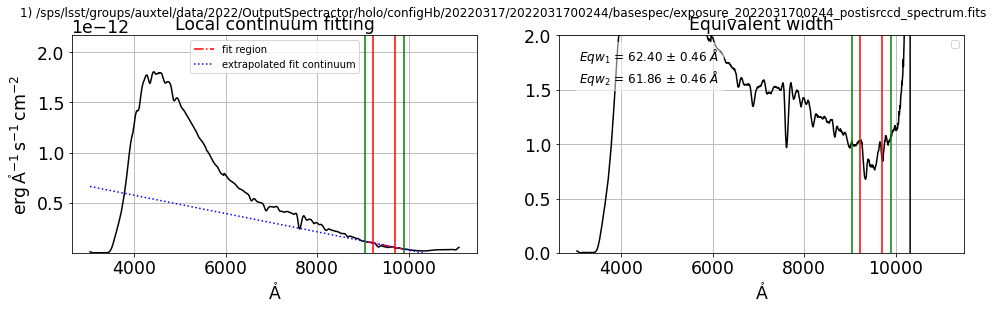

In [81]:
fig=plt.figure(figsize=(16,4))
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)
eqw10,eqw20,eq1_set,eq2_set=ComputeEquivWidth_bootstrap(spec,specerr,wlmin,wlmax,wlminline,wlmaxline,NN=30,flag_plot=True,ax1=ax1,ax2=ax2)
plt.suptitle(thetitle)

Text(0.5, 0.98, '1) /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700244/basespec/exposure_2022031700244_postisrccd_spectrum.fits')

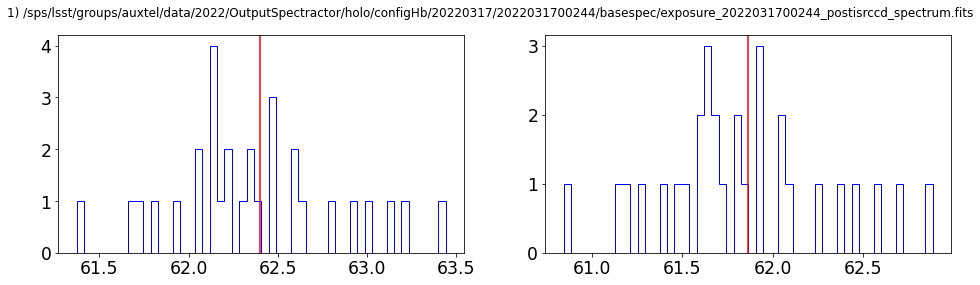

In [82]:
fig=plt.figure(figsize=(16,4))
ax1 = fig.add_subplot(1, 2, 1)
ax1.hist(eq1_set,bins=50,histtype='step',color='b');
ax1.axvline(eqw10,color='r')
ax2 = fig.add_subplot(1, 2, 2)
ax2.hist(eq2_set,bins=50,histtype='step',color='b');
ax2.axvline(eqw20,color='r')
plt.suptitle(thetitle)

## LOOP on O2 lines

0 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700238/basespec/exposure_2022031700238_postisrccd_spectrum.fits
set date_obs to 2022-03-18T00:51:22.049
set expo to 20.0
set airmass to 1.11557476948966
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1753951396614214
set dec to -32.3064444444444
set hour_angle to 30.8762989508295
set temperature to 8.9
set pressure to 743.45
set humidity to 48.0
set lambda_ref to 626.6801216985461
set parallactic_angle to 93.8012496664173
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_47 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:34:43  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


0 ) eqw_O2= 15.228155714875157
1 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700244/basespec/exposure_2022031700244_postisrccd_spectrum.fits
set date_obs to 2022-03-18T00:54:16.312
set expo to 20.0
set airmass to 1.121576965054115
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1741806116248446
set dec to -32.3064444444444
set hour_angle to 31.60492174100415
set temperature to 8.9
set pressure to 743.45
set humidity to 49.0
set lambda_ref to 626.883564656571
set parallactic_angle to 94.10618686949074
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_48 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:35:12  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


1 ) eqw_O2= 15.870666056035901
2 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700245/basespec/exposure_2022031700245_postisrccd_spectrum.fits
set date_obs to 2022-03-18T00:54:49.235
set expo to 20.0
set airmass to 1.12272698054768
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1736210434249555
set dec to -32.3064444444444
set hour_angle to 31.7419273199217
set temperature to 8.8
set pressure to 743.4
set humidity to 49.0
set lambda_ref to 626.0378655266279
set parallactic_angle to 94.16305953909519
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_49 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:35:42  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


2 ) eqw_O2= 15.840355215810035
3 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700251/basespec/exposure_2022031700251_postisrccd_spectrum.fits
set date_obs to 2022-03-18T00:57:47.565
set expo to 20.0
set airmass to 1.12910731186445
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1713060449152569
set dec to -32.3064444444444
set hour_angle to 32.4876824869983
set temperature to 8.9
set pressure to 743.4
set humidity to 50.0
set lambda_ref to 626.4911208542796
set parallactic_angle to 94.47019502924495
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_50 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:36:11  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


3 ) eqw_O2= -11.922505445392545
4 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700252/basespec/exposure_2022031700252_postisrccd_spectrum.fits
set date_obs to 2022-03-18T00:58:20.709
set expo to 20.0
set airmass to 1.130309156823195
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.169943439836599
set dec to -32.3064444444444
set hour_angle to 32.6255240863161
set temperature to 8.9
set pressure to 743.4
set humidity to 50.0
set lambda_ref to 626.2751365569749
set parallactic_angle to 94.52653019757676
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_51 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:36:41  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


4 ) eqw_O2= 16.08874495847553
5 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700265/basespec/exposure_2022031700265_postisrccd_spectrum.fits
set date_obs to 2022-03-18T01:04:49.716
set expo to 20.0
set airmass to 1.14502998698828
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1680537967029804
set dec to -32.3064444444444
set hour_angle to 34.25103021292454
set temperature to 8.9
set pressure to 743.3
set humidity to 53.0
set lambda_ref to 626.5383418087131
set parallactic_angle to 95.18153718788132
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_52 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:37:11  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


5 ) eqw_O2= 16.22246046764883
6 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700272/basespec/exposure_2022031700272_postisrccd_spectrum.fits
set date_obs to 2022-03-18T01:08:18.080
set expo to 20.0
set airmass to 1.1533391050821
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.165620392992809
set dec to -32.3064444444444
set hour_angle to 35.12228883044955
set temperature to 8.9
set pressure to 743.3
set humidity to 51.0
set lambda_ref to 626.067912732114
set parallactic_angle to 95.52618006847594
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_53 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:37:40  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


6 ) eqw_O2= 16.555371113343824
7 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700273/basespec/exposure_2022031700273_postisrccd_spectrum.fits
set date_obs to 2022-03-18T01:08:50.992
set expo to 20.0
set airmass to 1.154683255421995
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1687630065527601
set dec to -32.3064444444444
set hour_angle to 35.26034049072464
set temperature to 8.9
set pressure to 743.35
set humidity to 51.0
set lambda_ref to 626.2488273411835
set parallactic_angle to 95.58041503368928
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_54 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:38:10  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


7 ) eqw_O2= 16.501388639731857
8 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700279/basespec/exposure_2022031700279_postisrccd_spectrum.fits
set date_obs to 2022-03-18T01:11:46.031
set expo to 20.0
set airmass to 1.16193866550813
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1650200479066801
set dec to -32.3064444444444
set hour_angle to 35.99118130784399
set temperature to 8.9
set pressure to 743.4
set humidity to 53.0
set lambda_ref to 625.9517855761172
set parallactic_angle to 95.86593376321808
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_55 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:38:40  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


8 ) eqw_O2= 16.89110898293964
9 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700286/basespec/exposure_2022031700286_postisrccd_spectrum.fits
set date_obs to 2022-03-18T01:15:18.583
set expo to 20.0
set airmass to 1.17105276018288
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1604530597215738
set dec to -32.3064444444444
set hour_angle to 36.87993052247099
set temperature to 8.9
set pressure to 743.45
set humidity to 54.0
set lambda_ref to 626.415954438991
set parallactic_angle to 96.20974235390722
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_56 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:39:10  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


9 ) eqw_O2= 16.461031849463808
10 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700293/basespec/exposure_2022031700293_postisrccd_spectrum.fits
set date_obs to 2022-03-18T01:18:45.526
set expo to 20.0
set airmass to 1.18024864471996
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.161506254140246
set dec to -32.3064444444444
set hour_angle to 37.74449227926539
set temperature to 9.0
set pressure to 743.45
set humidity to 53.0
set lambda_ref to 626.2661772674467
set parallactic_angle to 96.54092631927332
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_57 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:39:39  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


10 ) eqw_O2= 17.29907813970877
11 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700300/basespec/exposure_2022031700300_postisrccd_spectrum.fits
set date_obs to 2022-03-18T01:22:16.238
set expo to 20.0
set airmass to 1.189962402398665
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1600582040885921
set dec to -32.3064444444444
set hour_angle to 38.6257061937975
set temperature to 8.9
set pressure to 743.4
set humidity to 56.0
set lambda_ref to 626.2915574183227
set parallactic_angle to 96.875483029922
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_58 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:40:09  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


11 ) eqw_O2= -18.634682448834326
12 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700301/basespec/exposure_2022031700301_postisrccd_spectrum.fits
set date_obs to 2022-03-18T01:22:49.144
set expo to 20.0
set airmass to 1.191505368069865
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1585750124351514
set dec to -32.3064444444444
set hour_angle to 38.76271209839639
set temperature to 9.0
set pressure to 743.45
set humidity to 56.0
set lambda_ref to 626.4868452630084
set parallactic_angle to 96.92724413418016
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_59 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:40:39  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


12 ) eqw_O2= -11.196571960447983
13 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700310/basespec/exposure_2022031700310_postisrccd_spectrum.fits
set date_obs to 2022-03-18T01:43:57.837
set expo to 20.0
set airmass to 1.25822658979951
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1476502374643685
set dec to -32.3064444444444
set hour_angle to 44.06414790775874
set temperature to 8.8
set pressure to 743.55
set humidity to 56.0
set lambda_ref to 626.6251269515418
set parallactic_angle to 98.88882683561982
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_60 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:41:09  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


13 ) eqw_O2= 18.43739971308591
14 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700316/basespec/exposure_2022031700316_postisrccd_spectrum.fits
set date_obs to 2022-03-18T01:46:52.361
set expo to 20.0
set airmass to 1.26858445121286
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1476350630254128
set dec to -32.3064444444444
set hour_angle to 44.79438636254909
set temperature to 8.7
set pressure to 743.55
set humidity to 56.0
set lambda_ref to 627.6256863262817
set parallactic_angle to 99.15414320783184
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_61 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:41:39  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


14 ) eqw_O2= 18.355598297628745
15 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700317/basespec/exposure_2022031700317_postisrccd_spectrum.fits
set date_obs to 2022-03-18T01:47:25.256
set expo to 20.0
set airmass to 1.27056341471374
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1466645118411156
set dec to -32.3064444444444
set hour_angle to 44.9315970155517
set temperature to 8.7
set pressure to 743.55
set humidity to 56.0
set lambda_ref to 625.7408027741238
set parallactic_angle to 99.2038979478238
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_62 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:42:09  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


15 ) eqw_O2= 17.912873299571203
16 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700330/basespec/exposure_2022031700330_postisrccd_spectrum.fits
set date_obs to 2022-03-18T01:53:46.736
set expo to 20.0
set airmass to 1.294394244363805
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1444547716136137
set dec to -32.3064444444444
set hour_angle to 46.52581667330039
set temperature to 8.6
set pressure to 743.5
set humidity to 56.0
set lambda_ref to 627.9120383005036
set parallactic_angle to 99.77999069166285
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_63 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:42:38  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


16 ) eqw_O2= 18.529531795884395
17 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700331/basespec/exposure_2022031700331_postisrccd_spectrum.fits
set date_obs to 2022-03-18T01:54:19.724
set expo to 20.0
set airmass to 1.29652271576687
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1441648974084375
set dec to -32.3064444444444
set hour_angle to 46.6628171725209
set temperature to 8.6
set pressure to 743.5
set humidity to 56.0
set lambda_ref to 627.7462807078947
set parallactic_angle to 99.82934304254884
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_64 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:43:08  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


17 ) eqw_O2= 18.97993341089952
18 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700338/basespec/exposure_2022031700338_postisrccd_spectrum.fits
set date_obs to 2022-03-18T01:57:49.306
set expo to 20.0
set airmass to 1.31035777011874
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1437462230173573
set dec to -32.3064444444444
set hour_angle to 47.53898537176394
set temperature to 8.7
set pressure to 743.45
set humidity to 57.0
set lambda_ref to 628.9551099539515
set parallactic_angle to 100.14447493807
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_65 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:43:39  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


18 ) eqw_O2= 19.07191635599787
19 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700345/basespec/exposure_2022031700345_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:01:19.196
set expo to 20.0
set airmass to 1.324716687989025
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1392710710370809
set dec to -32.3064444444444
set hour_angle to 48.4163008821963
set temperature to 8.6
set pressure to 743.45
set humidity to 59.0
set lambda_ref to 626.8625000130343
set parallactic_angle to 100.4592627484374
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_66 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:44:09  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


19 ) eqw_O2= 19.49861321382909
20 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700351/basespec/exposure_2022031700351_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:04:16.794
set expo to 20.0
set airmass to 1.33727547076682
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1388486262435704
set dec to -32.3064444444444
set hour_angle to 49.15879882143194
set temperature to 8.5
set pressure to 743.45
set humidity to 58.0
set lambda_ref to 628.5424256920012
set parallactic_angle to 100.7251843777299
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_67 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


/tmp/ipykernel_13858/2786507044.py:39: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig=plt.figure(figsize=(16,4))
2022-04-05 22:44:39  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


20 ) eqw_O2= 19.57536179173752
21 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700352/basespec/exposure_2022031700352_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:04:49.712
set expo to 20.0
set airmass to 1.33963651479802
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1368681187146323
set dec to -32.3064444444444
set hour_angle to 49.29580448438519
set temperature to 8.5
set pressure to 743.35
set humidity to 58.0
set lambda_ref to 628.2086674961155
set parallactic_angle to 100.7742095756281
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_68 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:45:09  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


21 ) eqw_O2= 19.519639298269396
22 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700358/basespec/exposure_2022031700358_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:07:49.074
set expo to 20.0
set airmass to 1.352787300037425
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1331931685876357
set dec to -32.3064444444444
set hour_angle to 50.04587365708529
set temperature to 8.4
set pressure to 743.4
set humidity to 59.0
set lambda_ref to 627.9591693143808
set parallactic_angle to 101.0424069948098
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_69 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:45:39  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


22 ) eqw_O2= 19.56418976862301
23 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700365/basespec/exposure_2022031700365_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:11:20.051
set expo to 20.0
set airmass to 1.368765631503195
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1336440841342464
set dec to -32.3064444444444
set hour_angle to 50.92719907664954
set temperature to 8.4
set pressure to 743.4
set humidity to 59.0
set lambda_ref to 622.7051672626101
set parallactic_angle to 101.357174452077
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_70 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:46:09  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


23 ) eqw_O2= 20.058644314991597
24 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700366/basespec/exposure_2022031700366_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:11:53.006
set expo to 20.0
set airmass to 1.371319339871885
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1369079175197151
set dec to -32.3064444444444
set hour_angle to 51.06504024257939
set temperature to 8.4
set pressure to 743.45
set humidity to 59.0
set lambda_ref to 629.1845159477502
set parallactic_angle to 101.4063764649771
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_71 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:46:39  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


24 ) eqw_O2= 19.944772437483465
25 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700372/basespec/exposure_2022031700372_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:14:46.798
set expo to 20.0
set airmass to 1.38501167017706
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1310814762516916
set dec to -32.3064444444444
set hour_angle to 51.79156958975715
set temperature to 8.4
set pressure to 743.45
set humidity to 61.0
set lambda_ref to 627.5245232921197
set parallactic_angle to 101.6656129875546
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_72 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:47:10  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


25 ) eqw_O2= 20.741984100302858
26 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700373/basespec/exposure_2022031700373_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:15:19.743
set expo to 20.0
set airmass to 1.387649936190795
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1317245037126307
set dec to -32.3064444444444
set hour_angle to 51.92878009828319
set temperature to 8.4
set pressure to 743.45
set humidity to 61.0
set lambda_ref to 627.9968889639981
set parallactic_angle to 101.7145568247823
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_73 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:47:40  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


26 ) eqw_O2= 20.295138915595004
27 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700380/basespec/exposure_2022031700380_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:33:33.012
set expo to 20.0
set airmass to 1.48452422171666
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1197628273916148
set dec to -32.3064444444444
set hour_angle to 56.49902324990354
set temperature to 8.0
set pressure to 743.35
set humidity to 63.0
set lambda_ref to 628.5888123380201
set parallactic_angle to 103.3450343494105
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_74 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:48:10  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


27 ) eqw_O2= 21.73817783548597
28 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700386/basespec/exposure_2022031700386_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:36:30.874
set expo to 20.0
set airmass to 1.50213593383469
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1172584274998106
set dec to -32.3064444444444
set hour_angle to 57.24247377715349
set temperature to 8.1
set pressure to 743.45
set humidity to 64.0
set lambda_ref to 633.8101508297243
set parallactic_angle to 103.6108187575918
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_75 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:48:40  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


28 ) eqw_O2= 21.893514913361116
29 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700387/basespec/exposure_2022031700387_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:37:03.815
set expo to 20.0
set airmass to 1.50545657928364
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1211335036558286
set dec to -32.3064444444444
set hour_angle to 57.37947904087095
set temperature to 8.1
set pressure to 743.35
set humidity to 64.0
set lambda_ref to 628.2172036981787
set parallactic_angle to 103.6598297048832
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_76 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:49:10  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


29 ) eqw_O2= 22.750837290976904
30 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700393/basespec/exposure_2022031700393_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:40:00.839
set expo to 20.0
set airmass to 1.523657512515415
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1177429780701742
set dec to -32.3064444444444
set hour_angle to 58.11949120092164
set temperature to 8.0
set pressure to 743.4
set humidity to 64.0
set lambda_ref to 628.3577400172557
set parallactic_angle to 103.9247454603291
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_77 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:49:41  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


30 ) eqw_O2= 22.614576348668265
31 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700394/basespec/exposure_2022031700394_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:40:33.787
set expo to 20.0
set airmass to 1.527114954027915
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1169167488860146
set dec to -32.3064444444444
set hour_angle to 58.25733391386269
set temperature to 8.0
set pressure to 743.4
set humidity to 64.0
set lambda_ref to 628.7847433714671
set parallactic_angle to 103.9741296646409
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_78 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:50:11  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


31 ) eqw_O2= 23.0625386453452
32 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700401/basespec/exposure_2022031700401_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:44:05.105
set expo to 20.0
set airmass to 1.54976447202586
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1144055844584487
set dec to -32.3064444444444
set hour_angle to 59.14046723526914
set temperature to 8.0
set pressure to 743.45
set humidity to 64.0
set lambda_ref to 629.2826348266267
set parallactic_angle to 104.2908413745483
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_79 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:50:41  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


32 ) eqw_O2= 22.272039358088193
33 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700407/basespec/exposure_2022031700407_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:47:02.835
set expo to 20.0
set airmass to 1.56951976624838
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.113192412444726
set dec to -32.3064444444444
set hour_angle to 59.88301895711849
set temperature to 8.0
set pressure to 743.4
set humidity to 64.0
set lambda_ref to 623.392411114623
set parallactic_angle to 104.5576025273592
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_80 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:51:12  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


33 ) eqw_O2= 22.968343900901402
34 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700408/basespec/exposure_2022031700408_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:47:35.769
set expo to 20.0
set airmass to 1.573248011911855
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1127873058479127
set dec to -32.3064444444444
set hour_angle to 60.02106934614464
set temperature to 8.0
set pressure to 743.45
set humidity to 64.0
set lambda_ref to 624.3168639615992
set parallactic_angle to 104.6072480488688
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_81 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:51:42  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


34 ) eqw_O2= 23.45215722194237
35 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700414/basespec/exposure_2022031700414_postisrccd_spectrum.fits
set date_obs to 2022-03-18T02:50:38.306
set expo to 20.0
set airmass to 1.594345273370295
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1038057563272595
set dec to -32.3064444444444
set hour_angle to 60.78322641711044
set temperature to 8.0
set pressure to 743.45
set humidity to 63.0
set lambda_ref to 625.6140852852044
set parallactic_angle to 104.8816435668321
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_82 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:52:12  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


35 ) eqw_O2= 22.989918881330595
36 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700421/basespec/exposure_2022031700421_postisrccd_spectrum.fits
set date_obs to 2022-03-18T03:08:41.573
set expo to 20.0
set airmass to 1.73594131895663
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.09058150608401207
set dec to -32.3064444444444
set hour_angle to 65.3119392087705
set temperature to 7.7
set pressure to 743.5
set humidity to 63.0
set lambda_ref to 631.9889212287092
set parallactic_angle to 106.5252810168807
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_83 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:52:42  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


36 ) eqw_O2= 24.45636652898108
37 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700422/basespec/exposure_2022031700422_postisrccd_spectrum.fits
set date_obs to 2022-03-18T03:09:14.484
set expo to 20.0
set airmass to 1.740715384660955
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.09733707671582016
set dec to -32.3064444444444
set hour_angle to 65.44894264967655
set temperature to 7.7
set pressure to 743.5
set humidity to 63.0
set lambda_ref to 625.9596270530473
set parallactic_angle to 106.5754178018598
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_84 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:53:13  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


37 ) eqw_O2= 24.813584792296325
38 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700428/basespec/exposure_2022031700428_postisrccd_spectrum.fits
set date_obs to 2022-03-18T03:12:54.310
set expo to 20.0
set airmass to 2.129245852899135
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.143944791309082
set dec to -87.4721944444444
set hour_angle to -155.5929780702915
set temperature to 7.8
set pressure to 743.5
set humidity to 62.0
set lambda_ref to 686.0625390317258
set parallactic_angle to -156.1678055894986
target_name = HD185975, Selected object name for Simbad : HD185975
 MAIN_ID        RA           DEC      ... Z_VALUE_85 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
HD 185975 20 28 18.7398 -87 28 19.937 ... -0.0000650                1


2022-04-05 22:53:44  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


38 ) eqw_O2= 29.407068693699472
39 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700429/basespec/exposure_2022031700429_postisrccd_spectrum.fits
set date_obs to 2022-03-18T03:13:27.208
set expo to 20.0
set airmass to 2.1290679262036
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.09887590360164929
set dec to -87.4721944444444
set hour_angle to -155.455137691263
set temperature to 7.8
set pressure to 743.5
set humidity to 62.0
set lambda_ref to 636.4362643500099
set parallactic_angle to -156.0330469936088
target_name = HD185975, Selected object name for Simbad : HD185975
 MAIN_ID        RA           DEC      ... Z_VALUE_86 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
HD 185975 20 28 18.7398 -87 28 19.937 ... -0.0000650                1


2022-04-05 22:54:15  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


39 ) eqw_O2= 22.80290215478007
40 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700435/basespec/exposure_2022031700435_postisrccd_spectrum.fits
set date_obs to 2022-03-18T03:17:06.794
set expo to 20.0
set airmass to 1.81309435755974
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.09210139501009447
set dec to -32.3064444444444
set hour_angle to 67.42354300312304
set temperature to 7.7
set pressure to 743.45
set humidity to 63.0
set lambda_ref to 626.8738274489511
set parallactic_angle to 107.3011935159837
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_87 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:54:45  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


40 ) eqw_O2= 25.745342778193333
41 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700436/basespec/exposure_2022031700436_postisrccd_spectrum.fits
set date_obs to 2022-03-18T03:17:39.779
set expo to 20.0
set airmass to 1.818418067455135
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.08344429603447075
set dec to -32.3064444444444
set hour_angle to 67.56159248336594
set temperature to 7.7
set pressure to 743.4
set humidity to 63.0
set lambda_ref to 632.4252252976918
set parallactic_angle to 107.3521665962106
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_88 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:55:16  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


41 ) eqw_O2= 25.729681025887686
42 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700442/basespec/exposure_2022031700442_postisrccd_spectrum.fits
set date_obs to 2022-03-18T03:21:26.873
set expo to 20.0
set airmass to 1.856070090955285
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.06347269052355019
set dec to -32.3064444444444
set hour_angle to 68.51099093135984
set temperature to 7.8
set pressure to 743.4
set humidity to 62.0
set lambda_ref to 630.0633085655397
set parallactic_angle to 107.7035936917225
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_89 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:55:46  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


42 ) eqw_O2= 25.875911460864728
43 )  /sps/lsst/groups/auxtel/data/2022/OutputSpectractor/holo/configHb/20220317/2022031700443/basespec/exposure_2022031700443_postisrccd_spectrum.fits
set date_obs to 2022-03-18T03:21:59.878
set expo to 20.0
set airmass to 1.861691550345225
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.0769189759908508
set dec to -32.3064444444444
set hour_angle to 68.64883074724754
set temperature to 7.7
set pressure to 743.45
set humidity to 63.0
set lambda_ref to 633.3015467495994
set parallactic_angle to 107.7547458765076
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_90 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:56:17  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


43 ) eqw_O2= 25.366936369737118


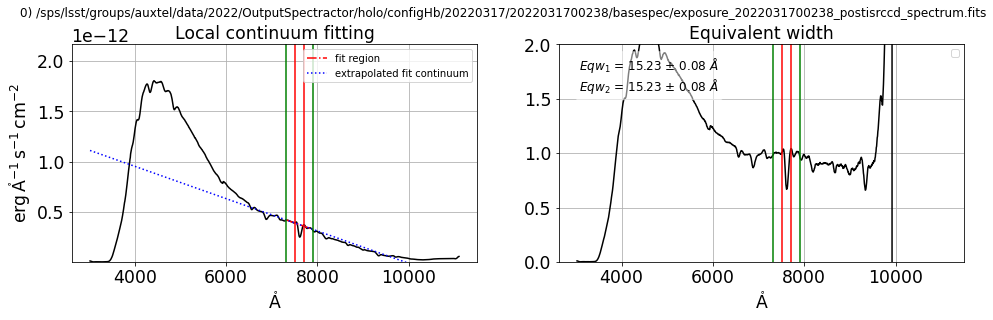

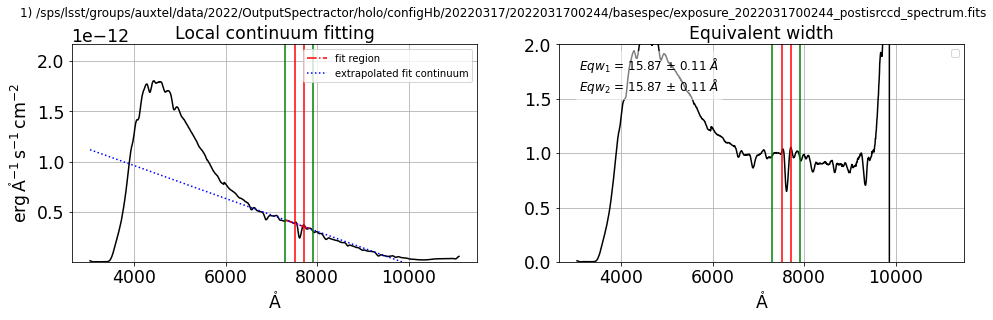

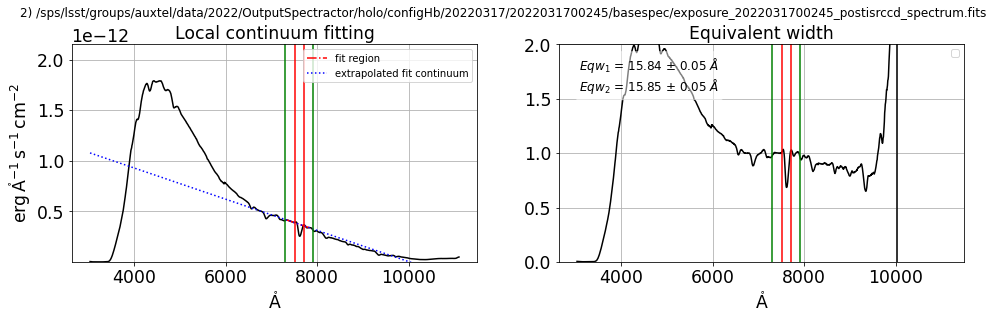

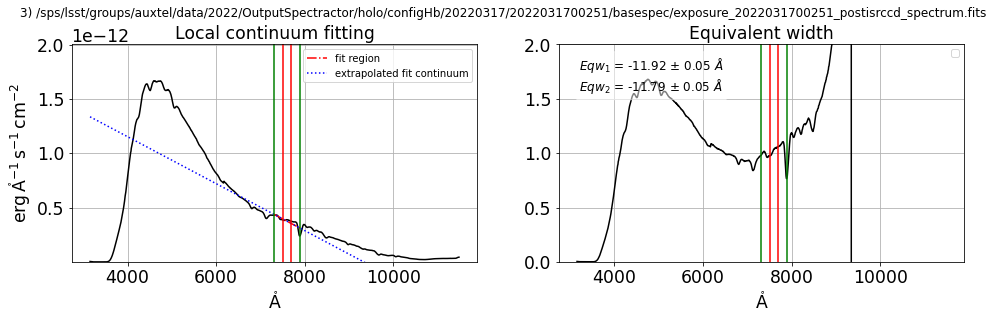

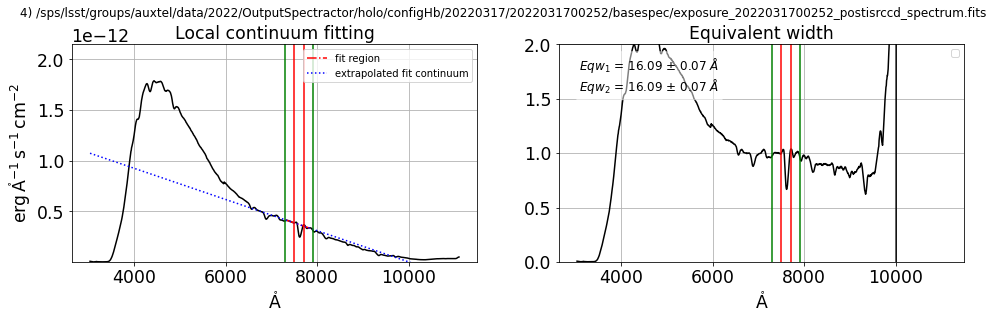

...

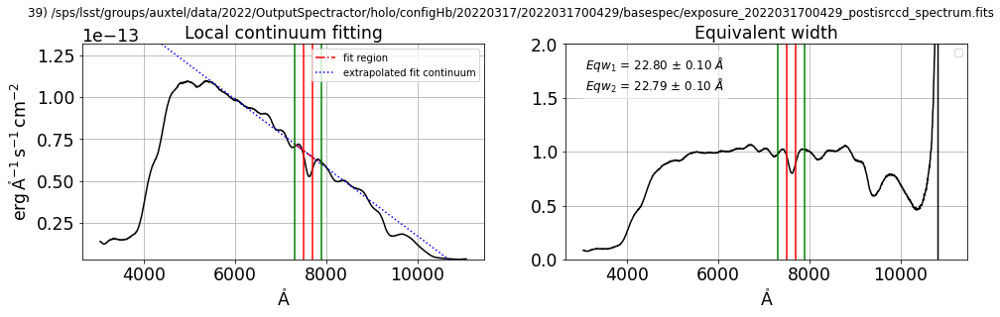

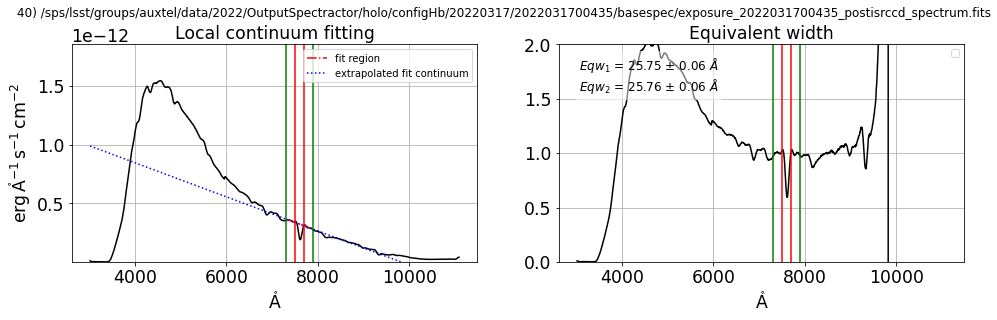

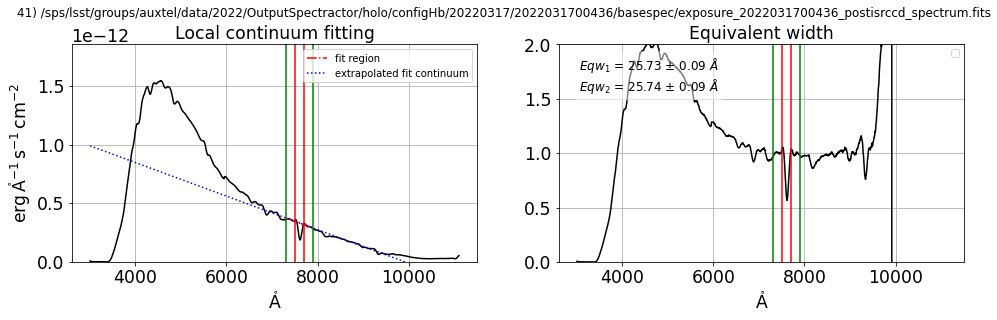

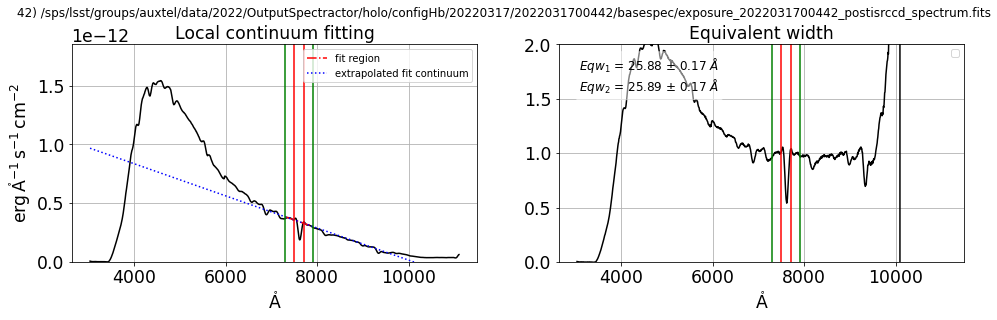

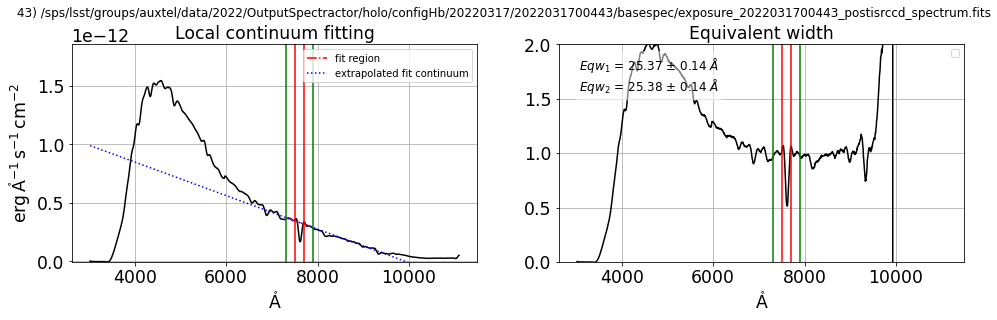

In [83]:
WLMIN=300
WLMAX=1000
lambdas = np.arange(WLMIN,WLMAX,1)
fwhm_func = interp1d(lambdas, 0.01 * lambdas)
parameters.DISPLAY=False


for IDXSEL in np.arange(0,NN):

    
    
    filename_SEL=all_good_spectra_spectrum_files[IDXSEL]
    filename_spectrogram_SEL=filename_SEL.replace("_spectrum","_spectrogram")
    fullfilename_SEL = os.path.join(dir_spectra,filename_SEL)
    fullfilename_spectrogram_SEL = fullfilename_SEL.replace("_spectrum","_spectrogram")
    
    # load the spectrum
    
    print(IDXSEL,") ",filename_SEL)
    
    s=Spectrum(fullfilename_SEL, config=config)
    s.load_spectrogram(fullfilename_spectrogram_SEL) 
    
    
    lamb = 10*s.lambdas * u.AA 
    flux = s.data * u.Unit('erg cm-2 s-1 AA-1')/10 
    spec = Spectrum1D(spectral_axis=lamb, flux=flux) 
    fluxerr = s.err * u.Unit('erg cm-2 s-1 AA-1')/10. 
    specerr = Spectrum1D(spectral_axis=lamb, flux=fluxerr)
    
    # O2 line
    wlmin=10*(O2_1.wavelength-30)*u.AA
    wlmax=10*(O2_1.wavelength+30)*u.AA
    wlminline=10*(O2_1.wavelength-10)*u.AA
    wlmaxline=10*(O2_1.wavelength+10)*u.AA
    
    
    
    fig=plt.figure(figsize=(16,4))
    ax1 = fig.add_subplot(1, 2, 1)
    ax2 = fig.add_subplot(1, 2, 2)
    #eq1,eq2=ComputeEquivWidth(spec,wlmin,wlmax,wlminline,wlmaxline,flag_plot=True,ax1=ax1,ax2=ax2)
    eqw10,eqw20,eq1_set,eq2_set=ComputeEquivWidth_bootstrap(spec,specerr,wlmin,wlmax,wlminline,wlmaxline,NN=20,flag_plot=True,ax1=ax1,ax2=ax2)
    thetitle=str(IDXSEL)+") "+filename_SEL
    plt.suptitle(thetitle,y=1.01)
    plt.show() 
    
    print(IDXSEL,") eqw_O2=",eqw10)
    
    df_infos.at[IDXSEL,"eqw_o2"] =  eqw10


## LOOP on H2O line

set date_obs to 2022-03-18T00:51:22.049
set expo to 20.0
set airmass to 1.11557476948966
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1753951396614214
set dec to -32.3064444444444
set hour_angle to 30.8762989508295
set temperature to 8.9
set pressure to 743.45
set humidity to 48.0
set lambda_ref to 626.6801216985461
set parallactic_angle to 93.8012496664173
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_91 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:57:05  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


0 ) eqw_O2= 61.40984704731642
set date_obs to 2022-03-18T00:54:16.312
set expo to 20.0
set airmass to 1.121576965054115
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1741806116248446
set dec to -32.3064444444444
set hour_angle to 31.60492174100415
set temperature to 8.9
set pressure to 743.45
set humidity to 49.0
set lambda_ref to 626.883564656571
set parallactic_angle to 94.10618686949074
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_92 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:57:10  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


1 ) eqw_O2= 62.402395690013805
set date_obs to 2022-03-18T00:54:49.235
set expo to 20.0
set airmass to 1.12272698054768
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1736210434249555
set dec to -32.3064444444444
set hour_angle to 31.7419273199217
set temperature to 8.8
set pressure to 743.4
set humidity to 49.0
set lambda_ref to 626.0378655266279
set parallactic_angle to 94.16305953909519
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_93 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:57:13  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


2 ) eqw_O2= 56.84957749587306
set date_obs to 2022-03-18T00:57:47.565
set expo to 20.0
set airmass to 1.12910731186445
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1713060449152569
set dec to -32.3064444444444
set hour_angle to 32.4876824869983
set temperature to 8.9
set pressure to 743.4
set humidity to 50.0
set lambda_ref to 626.4911208542796
set parallactic_angle to 94.47019502924495
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_94 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:57:17  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


3 ) eqw_O2= 9.552900005980973
set date_obs to 2022-03-18T00:58:20.709
set expo to 20.0
set airmass to 1.130309156823195
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.169943439836599
set dec to -32.3064444444444
set hour_angle to 32.6255240863161
set temperature to 8.9
set pressure to 743.4
set humidity to 50.0
set lambda_ref to 626.2751365569749
set parallactic_angle to 94.52653019757676
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_95 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:57:20  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


4 ) eqw_O2= 57.39355539173664
set date_obs to 2022-03-18T01:04:49.716
set expo to 20.0
set airmass to 1.14502998698828
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1680537967029804
set dec to -32.3064444444444
set hour_angle to 34.25103021292454
set temperature to 8.9
set pressure to 743.3
set humidity to 53.0
set lambda_ref to 626.5383418087131
set parallactic_angle to 95.18153718788132
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_96 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:57:24  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


5 ) eqw_O2= 61.52805005051215
set date_obs to 2022-03-18T01:08:18.080
set expo to 20.0
set airmass to 1.1533391050821
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.165620392992809
set dec to -32.3064444444444
set hour_angle to 35.12228883044955
set temperature to 8.9
set pressure to 743.3
set humidity to 51.0
set lambda_ref to 626.067912732114
set parallactic_angle to 95.52618006847594
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_97 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:57:27  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


6 ) eqw_O2= 57.46913485866094
set date_obs to 2022-03-18T01:08:50.992
set expo to 20.0
set airmass to 1.154683255421995
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1687630065527601
set dec to -32.3064444444444
set hour_angle to 35.26034049072464
set temperature to 8.9
set pressure to 743.35
set humidity to 51.0
set lambda_ref to 626.2488273411835
set parallactic_angle to 95.58041503368928
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_98 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:57:32  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


7 ) eqw_O2= 56.07684122090757
set date_obs to 2022-03-18T01:11:46.031
set expo to 20.0
set airmass to 1.16193866550813
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1650200479066801
set dec to -32.3064444444444
set hour_angle to 35.99118130784399
set temperature to 8.9
set pressure to 743.4
set humidity to 53.0
set lambda_ref to 625.9517855761172
set parallactic_angle to 95.86593376321808
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_99 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                            
--------- ------------- ------------- ... ---------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...  0.0003640                1


2022-04-05 22:57:36  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


8 ) eqw_O2= 52.39066215921844
set date_obs to 2022-03-18T01:15:18.583
set expo to 20.0
set airmass to 1.17105276018288
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1604530597215738
set dec to -32.3064444444444
set hour_angle to 36.87993052247099
set temperature to 8.9
set pressure to 743.45
set humidity to 54.0
set lambda_ref to 626.415954438991
set parallactic_angle to 96.20974235390722
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_100 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:57:39  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


9 ) eqw_O2= 58.257612146477754
set date_obs to 2022-03-18T01:18:45.526
set expo to 20.0
set airmass to 1.18024864471996
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.161506254140246
set dec to -32.3064444444444
set hour_angle to 37.74449227926539
set temperature to 9.0
set pressure to 743.45
set humidity to 53.0
set lambda_ref to 626.2661772674467
set parallactic_angle to 96.54092631927332
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_101 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:57:43  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


10 ) eqw_O2= 55.956963715823065
set date_obs to 2022-03-18T01:22:16.238
set expo to 20.0
set airmass to 1.189962402398665
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1600582040885921
set dec to -32.3064444444444
set hour_angle to 38.6257061937975
set temperature to 8.9
set pressure to 743.4
set humidity to 56.0
set lambda_ref to 626.2915574183227
set parallactic_angle to 96.875483029922
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_102 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:57:47  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


11 ) eqw_O2= 19.005380349336804
set date_obs to 2022-03-18T01:22:49.144
set expo to 20.0
set airmass to 1.191505368069865
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1585750124351514
set dec to -32.3064444444444
set hour_angle to 38.76271209839639
set temperature to 9.0
set pressure to 743.45
set humidity to 56.0
set lambda_ref to 626.4868452630084
set parallactic_angle to 96.92724413418016
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_103 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:57:51  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


12 ) eqw_O2= 10.114764346942309
set date_obs to 2022-03-18T01:43:57.837
set expo to 20.0
set airmass to 1.25822658979951
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1476502374643685
set dec to -32.3064444444444
set hour_angle to 44.06414790775874
set temperature to 8.8
set pressure to 743.55
set humidity to 56.0
set lambda_ref to 626.6251269515418
set parallactic_angle to 98.88882683561982
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_104 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:57:55  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


13 ) eqw_O2= 61.230860368304604
set date_obs to 2022-03-18T01:46:52.361
set expo to 20.0
set airmass to 1.26858445121286
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1476350630254128
set dec to -32.3064444444444
set hour_angle to 44.79438636254909
set temperature to 8.7
set pressure to 743.55
set humidity to 56.0
set lambda_ref to 627.6256863262817
set parallactic_angle to 99.15414320783184
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_105 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:57:59  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


14 ) eqw_O2= 62.867771595349154
set date_obs to 2022-03-18T01:47:25.256
set expo to 20.0
set airmass to 1.27056341471374
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1466645118411156
set dec to -32.3064444444444
set hour_angle to 44.9315970155517
set temperature to 8.7
set pressure to 743.55
set humidity to 56.0
set lambda_ref to 625.7408027741238
set parallactic_angle to 99.2038979478238
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_106 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:58:03  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


15 ) eqw_O2= 61.80697136534468
set date_obs to 2022-03-18T01:53:46.736
set expo to 20.0
set airmass to 1.294394244363805
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1444547716136137
set dec to -32.3064444444444
set hour_angle to 46.52581667330039
set temperature to 8.6
set pressure to 743.5
set humidity to 56.0
set lambda_ref to 627.9120383005036
set parallactic_angle to 99.77999069166285
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_107 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:58:06  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


16 ) eqw_O2= 64.30778548666251
set date_obs to 2022-03-18T01:54:19.724
set expo to 20.0
set airmass to 1.29652271576687
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1441648974084375
set dec to -32.3064444444444
set hour_angle to 46.6628171725209
set temperature to 8.6
set pressure to 743.5
set humidity to 56.0
set lambda_ref to 627.7462807078947
set parallactic_angle to 99.82934304254884
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_108 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:58:11  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


17 ) eqw_O2= 60.50321307621738
set date_obs to 2022-03-18T01:57:49.306
set expo to 20.0
set airmass to 1.31035777011874
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1437462230173573
set dec to -32.3064444444444
set hour_angle to 47.53898537176394
set temperature to 8.7
set pressure to 743.45
set humidity to 57.0
set lambda_ref to 628.9551099539515
set parallactic_angle to 100.14447493807
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_109 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:58:15  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


18 ) eqw_O2= 63.197871481654204
set date_obs to 2022-03-18T02:01:19.196
set expo to 20.0
set airmass to 1.324716687989025
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1392710710370809
set dec to -32.3064444444444
set hour_angle to 48.4163008821963
set temperature to 8.6
set pressure to 743.45
set humidity to 59.0
set lambda_ref to 626.8625000130343
set parallactic_angle to 100.4592627484374
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_110 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:58:19  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


19 ) eqw_O2= 59.95786213186432
set date_obs to 2022-03-18T02:04:16.794
set expo to 20.0
set airmass to 1.33727547076682
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1388486262435704
set dec to -32.3064444444444
set hour_angle to 49.15879882143194
set temperature to 8.5
set pressure to 743.45
set humidity to 58.0
set lambda_ref to 628.5424256920012
set parallactic_angle to 100.7251843777299
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_111 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


/tmp/ipykernel_13858/2779024817.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig=plt.figure(figsize=(16,4))
2022-04-05 22:58:23  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


20 ) eqw_O2= 62.97031718808705
set date_obs to 2022-03-18T02:04:49.712
set expo to 20.0
set airmass to 1.33963651479802
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1368681187146323
set dec to -32.3064444444444
set hour_angle to 49.29580448438519
set temperature to 8.5
set pressure to 743.35
set humidity to 58.0
set lambda_ref to 628.2086674961155
set parallactic_angle to 100.7742095756281
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_112 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:58:27  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


21 ) eqw_O2= 60.49168586813175
set date_obs to 2022-03-18T02:07:49.074
set expo to 20.0
set airmass to 1.352787300037425
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1331931685876357
set dec to -32.3064444444444
set hour_angle to 50.04587365708529
set temperature to 8.4
set pressure to 743.4
set humidity to 59.0
set lambda_ref to 627.9591693143808
set parallactic_angle to 101.0424069948098
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_113 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:58:32  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


22 ) eqw_O2= 62.05543416588279
set date_obs to 2022-03-18T02:11:20.051
set expo to 20.0
set airmass to 1.368765631503195
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1336440841342464
set dec to -32.3064444444444
set hour_angle to 50.92719907664954
set temperature to 8.4
set pressure to 743.4
set humidity to 59.0
set lambda_ref to 622.7051672626101
set parallactic_angle to 101.357174452077
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_114 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:58:36  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


23 ) eqw_O2= 63.37053813616211
set date_obs to 2022-03-18T02:11:53.006
set expo to 20.0
set airmass to 1.371319339871885
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1369079175197151
set dec to -32.3064444444444
set hour_angle to 51.06504024257939
set temperature to 8.4
set pressure to 743.45
set humidity to 59.0
set lambda_ref to 629.1845159477502
set parallactic_angle to 101.4063764649771
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_115 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:58:40  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


24 ) eqw_O2= 65.35883299655922
set date_obs to 2022-03-18T02:14:46.798
set expo to 20.0
set airmass to 1.38501167017706
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1310814762516916
set dec to -32.3064444444444
set hour_angle to 51.79156958975715
set temperature to 8.4
set pressure to 743.45
set humidity to 61.0
set lambda_ref to 627.5245232921197
set parallactic_angle to 101.6656129875546
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_116 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:58:44  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


25 ) eqw_O2= 59.39903046037733
set date_obs to 2022-03-18T02:15:19.743
set expo to 20.0
set airmass to 1.387649936190795
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1317245037126307
set dec to -32.3064444444444
set hour_angle to 51.92878009828319
set temperature to 8.4
set pressure to 743.45
set humidity to 61.0
set lambda_ref to 627.9968889639981
set parallactic_angle to 101.7145568247823
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_117 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:58:48  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


26 ) eqw_O2= 60.33648919615365
set date_obs to 2022-03-18T02:33:33.012
set expo to 20.0
set airmass to 1.48452422171666
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1197628273916148
set dec to -32.3064444444444
set hour_angle to 56.49902324990354
set temperature to 8.0
set pressure to 743.35
set humidity to 63.0
set lambda_ref to 628.5888123380201
set parallactic_angle to 103.3450343494105
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_118 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:58:53  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


27 ) eqw_O2= 62.660522002113794
set date_obs to 2022-03-18T02:36:30.874
set expo to 20.0
set airmass to 1.50213593383469
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1172584274998106
set dec to -32.3064444444444
set hour_angle to 57.24247377715349
set temperature to 8.1
set pressure to 743.45
set humidity to 64.0
set lambda_ref to 633.8101508297243
set parallactic_angle to 103.6108187575918
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_119 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:58:57  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


28 ) eqw_O2= 66.48258079714873
set date_obs to 2022-03-18T02:37:03.815
set expo to 20.0
set airmass to 1.50545657928364
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1211335036558286
set dec to -32.3064444444444
set hour_angle to 57.37947904087095
set temperature to 8.1
set pressure to 743.35
set humidity to 64.0
set lambda_ref to 628.2172036981787
set parallactic_angle to 103.6598297048832
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_120 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:59:01  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


29 ) eqw_O2= 66.14861955720374
set date_obs to 2022-03-18T02:40:00.839
set expo to 20.0
set airmass to 1.523657512515415
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1177429780701742
set dec to -32.3064444444444
set hour_angle to 58.11949120092164
set temperature to 8.0
set pressure to 743.4
set humidity to 64.0
set lambda_ref to 628.3577400172557
set parallactic_angle to 103.9247454603291
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_121 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:59:06  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


30 ) eqw_O2= 63.80059027651424
set date_obs to 2022-03-18T02:40:33.787
set expo to 20.0
set airmass to 1.527114954027915
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1169167488860146
set dec to -32.3064444444444
set hour_angle to 58.25733391386269
set temperature to 8.0
set pressure to 743.4
set humidity to 64.0
set lambda_ref to 628.7847433714671
set parallactic_angle to 103.9741296646409
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_122 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:59:11  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


31 ) eqw_O2= 65.97952305455595
set date_obs to 2022-03-18T02:44:05.105
set expo to 20.0
set airmass to 1.54976447202586
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1144055844584487
set dec to -32.3064444444444
set hour_angle to 59.14046723526914
set temperature to 8.0
set pressure to 743.45
set humidity to 64.0
set lambda_ref to 629.2826348266267
set parallactic_angle to 104.2908413745483
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_123 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:59:16  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


32 ) eqw_O2= 67.09373855164785
set date_obs to 2022-03-18T02:47:02.835
set expo to 20.0
set airmass to 1.56951976624838
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.113192412444726
set dec to -32.3064444444444
set hour_angle to 59.88301895711849
set temperature to 8.0
set pressure to 743.4
set humidity to 64.0
set lambda_ref to 623.392411114623
set parallactic_angle to 104.5576025273592
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_124 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:59:20  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


33 ) eqw_O2= 68.16879110930859
set date_obs to 2022-03-18T02:47:35.769
set expo to 20.0
set airmass to 1.573248011911855
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1127873058479127
set dec to -32.3064444444444
set hour_angle to 60.02106934614464
set temperature to 8.0
set pressure to 743.45
set humidity to 64.0
set lambda_ref to 624.3168639615992
set parallactic_angle to 104.6072480488688
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_125 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:59:24  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


34 ) eqw_O2= 69.63448701282402
set date_obs to 2022-03-18T02:50:38.306
set expo to 20.0
set airmass to 1.594345273370295
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.1038057563272595
set dec to -32.3064444444444
set hour_angle to 60.78322641711044
set temperature to 8.0
set pressure to 743.45
set humidity to 63.0
set lambda_ref to 625.6140852852044
set parallactic_angle to 104.8816435668321
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_126 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:59:29  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


35 ) eqw_O2= 67.7277244180346
set date_obs to 2022-03-18T03:08:41.573
set expo to 20.0
set airmass to 1.73594131895663
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.09058150608401207
set dec to -32.3064444444444
set hour_angle to 65.3119392087705
set temperature to 7.7
set pressure to 743.5
set humidity to 63.0
set lambda_ref to 631.9889212287092
set parallactic_angle to 106.5252810168807
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_127 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:59:35  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


36 ) eqw_O2= 70.47944079587546
set date_obs to 2022-03-18T03:09:14.484
set expo to 20.0
set airmass to 1.740715384660955
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.09733707671582016
set dec to -32.3064444444444
set hour_angle to 65.44894264967655
set temperature to 7.7
set pressure to 743.5
set humidity to 63.0
set lambda_ref to 625.9596270530473
set parallactic_angle to 106.5754178018598
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_128 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:59:39  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


37 ) eqw_O2= 69.5558173493232
set date_obs to 2022-03-18T03:12:54.310
set expo to 20.0
set airmass to 2.129245852899135
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.143944791309082
set dec to -87.4721944444444
set hour_angle to -155.5929780702915
set temperature to 7.8
set pressure to 743.5
set humidity to 62.0
set lambda_ref to 686.0625390317258
set parallactic_angle to -156.1678055894986
target_name = HD185975, Selected object name for Simbad : HD185975
 MAIN_ID        RA           DEC      ... Z_VALUE_129 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
HD 185975 20 28 18.7398 -87 28 19.937 ...  -0.0000650                1


2022-04-05 22:59:44  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


38 ) eqw_O2= 103.25519643024057
set date_obs to 2022-03-18T03:13:27.208
set expo to 20.0
set airmass to 2.1290679262036
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.09887590360164929
set dec to -87.4721944444444
set hour_angle to -155.455137691263
set temperature to 7.8
set pressure to 743.5
set humidity to 62.0
set lambda_ref to 636.4362643500099
set parallactic_angle to -156.0330469936088
target_name = HD185975, Selected object name for Simbad : HD185975
 MAIN_ID        RA           DEC      ... Z_VALUE_130 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
HD 185975 20 28 18.7398 -87 28 19.937 ...  -0.0000650                1


2022-04-05 22:59:49  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


39 ) eqw_O2= 89.63379700635176
set date_obs to 2022-03-18T03:17:06.794
set expo to 20.0
set airmass to 1.81309435755974
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.09210139501009447
set dec to -32.3064444444444
set hour_angle to 67.42354300312304
set temperature to 7.7
set pressure to 743.45
set humidity to 63.0
set lambda_ref to 626.8738274489511
set parallactic_angle to 107.3011935159837
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_131 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:59:53  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


40 ) eqw_O2= 73.38437829889841
set date_obs to 2022-03-18T03:17:39.779
set expo to 20.0
set airmass to 1.818418067455135
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.08344429603447075
set dec to -32.3064444444444
set hour_angle to 67.56159248336594
set temperature to 7.7
set pressure to 743.4
set humidity to 63.0
set lambda_ref to 632.4252252976918
set parallactic_angle to 107.3521665962106
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_132 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 22:59:59  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


41 ) eqw_O2= 70.96555724187124
set date_obs to 2022-03-18T03:21:26.873
set expo to 20.0
set airmass to 1.856070090955285
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.06347269052355019
set dec to -32.3064444444444
set hour_angle to 68.51099093135984
set temperature to 7.8
set pressure to 743.4
set humidity to 62.0
set lambda_ref to 630.0633085655397
set parallactic_angle to 107.7035936917225
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_133 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 23:00:04  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


42 ) eqw_O2= 67.03642402199819
set date_obs to 2022-03-18T03:21:59.878
set expo to 20.0
set airmass to 1.861691550345225
set disperser_label to holo4_003
set units to erg/s/cm$^2$/nm
set rotation_angle to 0.0769189759908508
set dec to -32.3064444444444
set hour_angle to 68.64883074724754
set temperature to 7.7
set pressure to 743.45
set humidity to 63.0
set lambda_ref to 633.3015467495994
set parallactic_angle to 107.7547458765076
target_name = mu.col, Selected object name for Simbad : mu. Col
 MAIN_ID        RA           DEC      ... Z_VALUE_134 SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...                             
--------- ------------- ------------- ... ----------- ----------------
* mu. Col 05 45 59.8950 -32 18 23.162 ...   0.0003640                1


2022-04-05 23:00:09  astropy    _showwarning         WARNING Model is linear in parameters; consider using linear fitting methods.


43 ) eqw_O2= 71.68220759718076


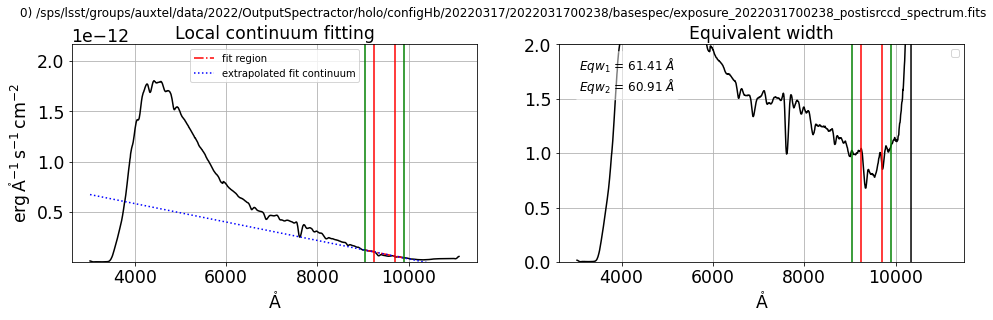

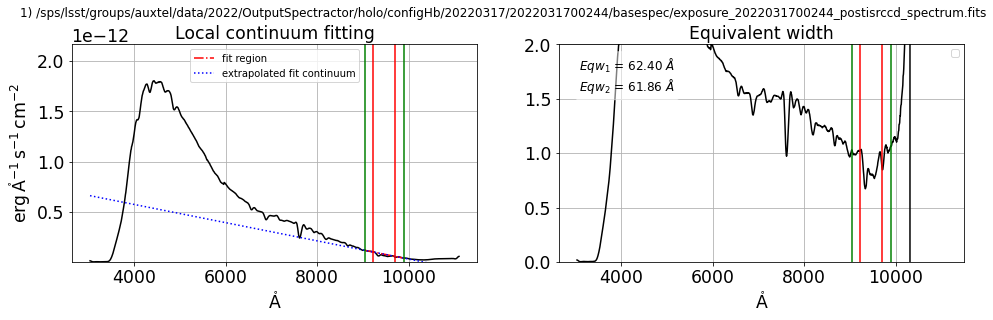

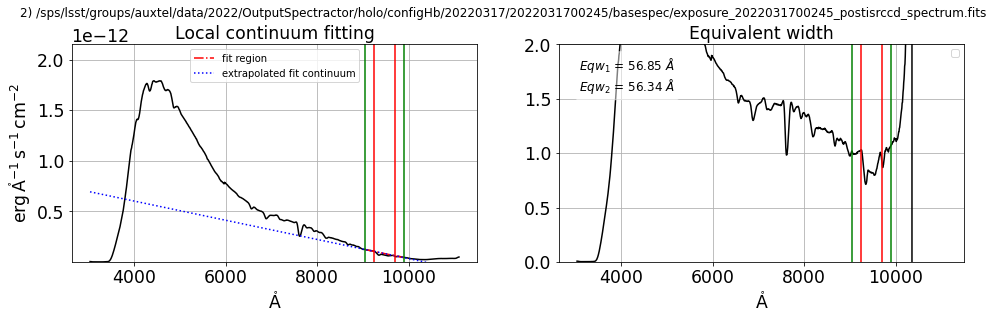

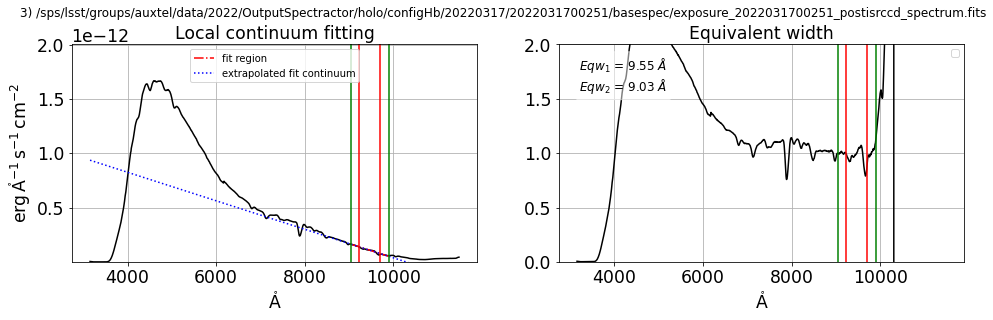

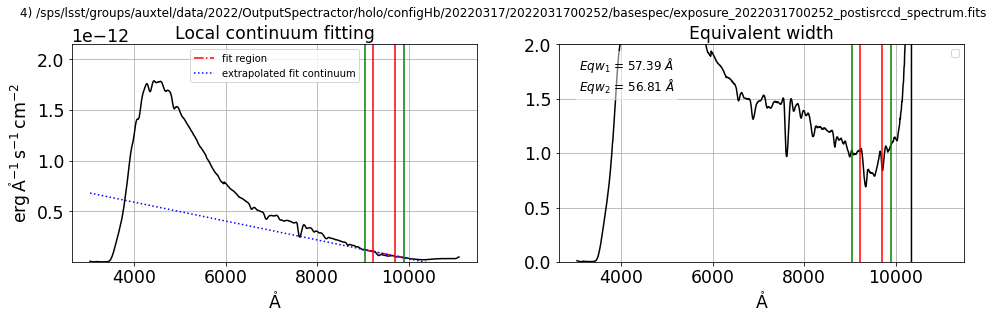

...

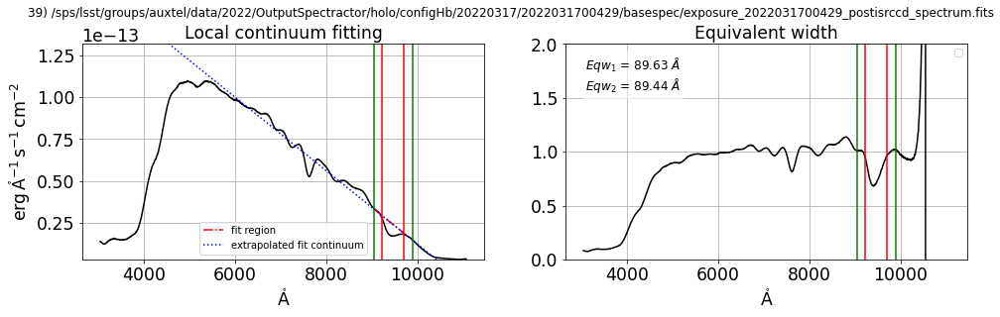

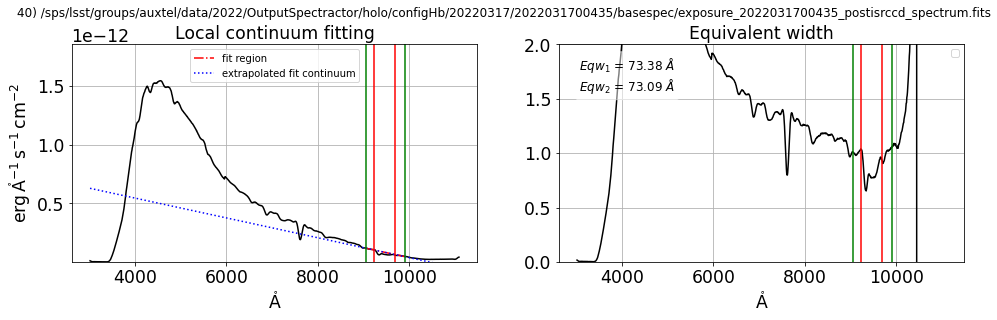

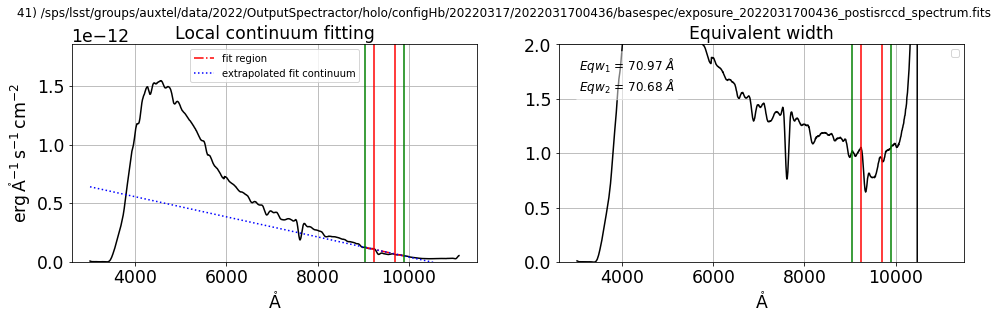

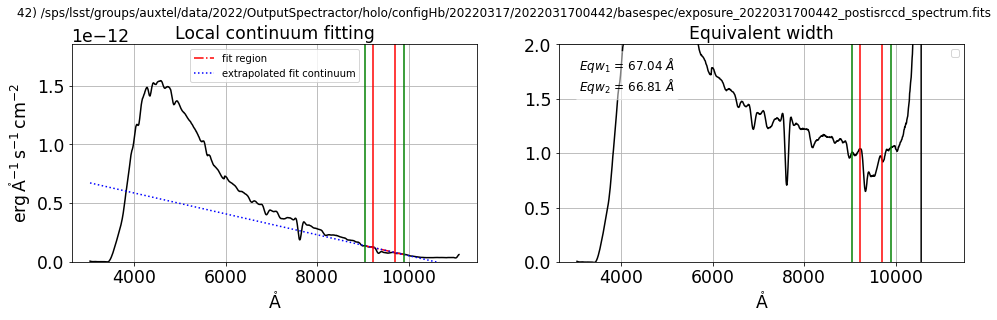

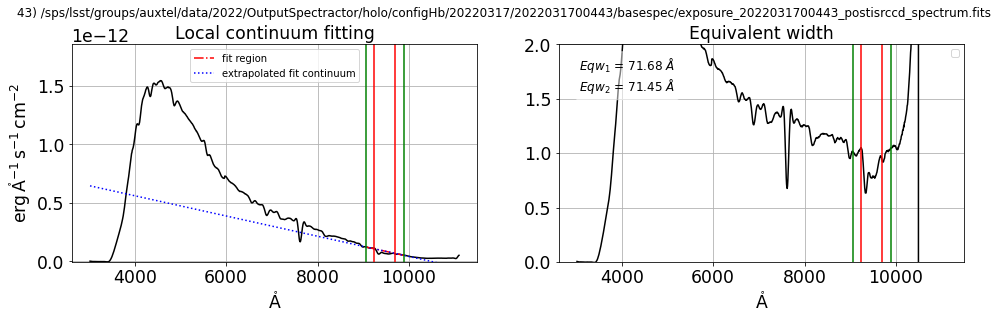

In [84]:
WLMIN=300
WLMAX=1000
lambdas = np.arange(WLMIN,WLMAX,1)
fwhm_func = interp1d(lambdas, 0.01 * lambdas)
parameters.DISPLAY=False


for IDXSEL in np.arange(0,NN):
    filename_SEL=all_good_spectra_spectrum_files[IDXSEL]
    filename_spectrogram_SEL=filename_SEL.replace("_spectrum","_spectrogram")
    fullfilename_SEL = os.path.join(dir_spectra,filename_SEL)
    fullfilename_spectrogram_SEL = fullfilename_SEL.replace("_spectrum","_spectrogram")
    
    # load the spectrum
    s=Spectrum(fullfilename_SEL, config=config)
    s.load_spectrogram(fullfilename_spectrogram_SEL) 
    
    
    lamb = 10*s.lambdas * u.AA 
    flux = s.data * u.Unit('erg cm-2 s-1 AA-1')/10 
    spec = Spectrum1D(spectral_axis=lamb, flux=flux) 
    fluxerr = s.err * u.Unit('erg cm-2 s-1 AA-1')/10. 
    specerr = Spectrum1D(spectral_axis=lamb, flux=fluxerr)
    
    # H2O line
    
    wlmin=10*(H2O_1.wavelength-30)*u.AA
    wlmax=10*(H2O_2.wavelength+30)*u.AA
    wlminline=10*(H2O_1.wavelength-12)*u.AA
    wlmaxline=10*(H2O_2.wavelength+10)*u.AA
    
    
    fig=plt.figure(figsize=(16,4))
    ax1 = fig.add_subplot(1, 2, 1)
    ax2 = fig.add_subplot(1, 2, 2)
    eqw1,eqw2=ComputeEquivWidth(spec,wlmin,wlmax,wlminline,wlmaxline,flag_plot=True,ax1=ax1,ax2=ax2)
    #eqw10,eqw20,eq1_set,eq2_set=ComputeEquivWidth_bootstrap(spec,specerr,wlmin,wlmax,wlminline,wlmaxline,NN=20,flag_plot=True,ax1=ax1,ax2=ax2)
    thetitle=str(IDXSEL)+") "+filename_SEL
    plt.suptitle(thetitle,y=1.01)
    plt.show() 
    
    print(IDXSEL,") eqw_O2=",eqw1)
    
    df_infos.at[IDXSEL,"eqw_h2o"] =  eqw1


In [85]:
df_infos

,object,date_obs,airmass,temperature,pressure,humidity,reftime,eqw_h2o,eqw_o2,eqw_o2_spec
idx,,,,,,,,,,
0,mu. Col,2022-03-18T00:51:22.049,1.115575,8.9,743.45,48.0,0.000000,61.409847,15.228156,NaN
1,mu. Col,2022-03-18T00:54:16.312,1.121577,8.9,743.45,49.0,0.048406,62.402396,15.870666,NaN
2,mu. Col,2022-03-18T00:54:49.235,1.122727,8.8,743.40,49.0,0.057552,56.849577,15.840355,NaN
3,mu. Col,2022-03-18T00:57:47.565,1.129107,8.9,743.40,50.0,0.107088,9.552900,-11.922505,NaN
4,mu. Col,2022-03-18T00:58:20.709,1.130309,8.9,743.40,50.0,0.116294,57.393555,16.088745,NaN
5,mu. Col,2022-03-18T01:04:49.716,1.145030,8.9,743.30,53.0,0.224352,61.528050,16.222460,NaN
6,mu. Col,2022-03-18T01:08:18.080,1.153339,8.9,743.30,51.0,0.282231,57.469135,16.555371,NaN
7,mu. Col,2022-03-18T01:08:50.992,1.154683,8.9,743.35,51.0,0.291373,56.076841,16.501389,NaN
8,mu. Col,2022-03-18T01:11:46.031,1.161939,8.9,743.40,53.0,0.339995,52.390662,16.891109,NaN


In [86]:
summary_file = f"equivwidth_{DATE}_{configdir}.csv"
df_infos.to_csv(summary_file)

Text(0.5, 1.0, 'Equivalent Widths vs date')

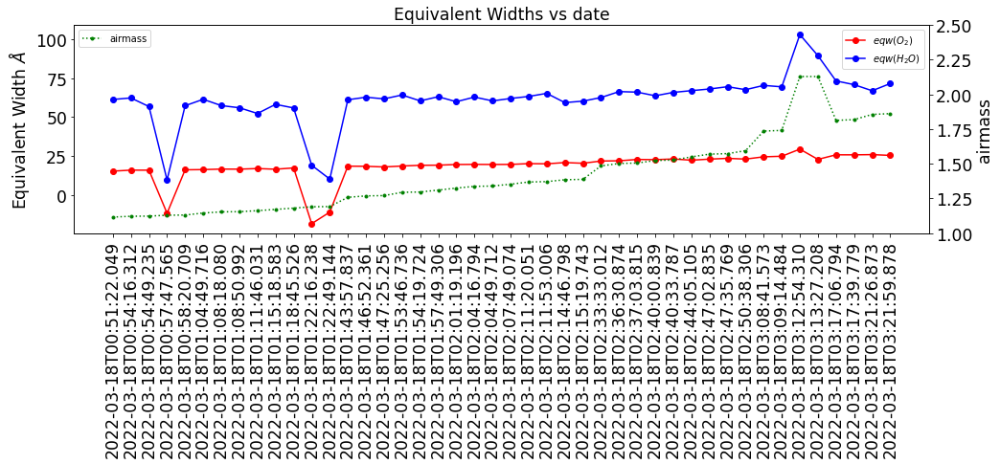

In [91]:
fig=plt.figure(figsize=(16,4))
#plt.xticks(rotation=90)
ax = fig.add_subplot(1, 1, 1)
ax.plot(df_infos['date_obs'], df_infos['eqw_o2'],marker="o",color="red",label="$eqw(O_2)$");
ax.plot(df_infos['date_obs'], df_infos['eqw_h2o'],marker="o",color="blue",label="$eqw(H_2O)$");
#ax.set_xticks(rotation='vertical');
ax.xaxis.set_tick_params(rotation=90)
ax.legend(loc="upper right")
ax.set_ylabel("Equivalent Width $\AA$")
ax2 = ax.twinx()
ax2.plot(df_infos['date_obs'], df_infos['airmass'],linestyle='dotted', marker='.',color="green",label="airmass")
ax2.set_ylim(1,2.5)
ax2.legend(loc="upper left")
ax2.set_ylabel("airmass")
ax.set_title("Equivalent Widths vs date")

Text(0.5, 1.0, 'Equivalent Widths vs date')

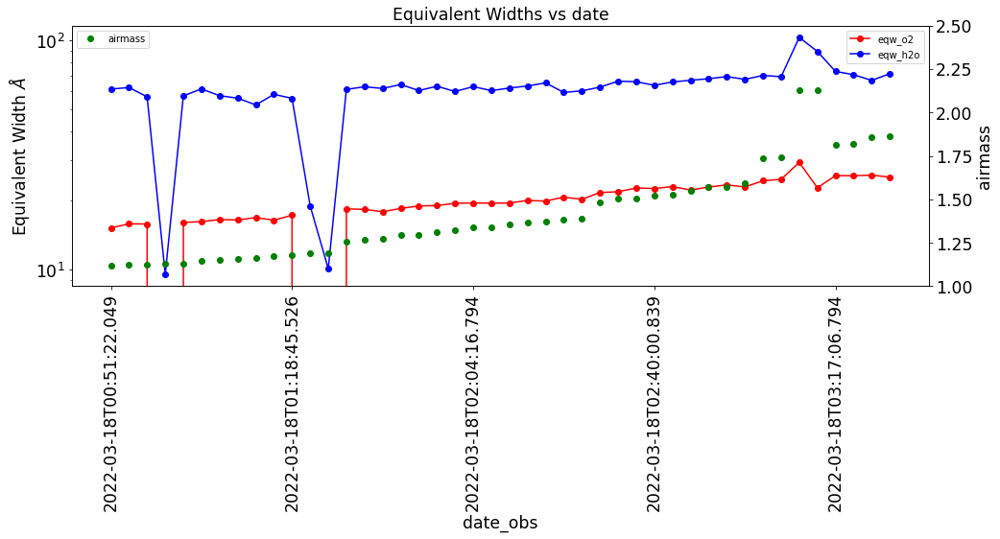

In [92]:
fig=plt.figure(figsize=(16,5))
#plt.xticks(rotation=90)
ax = fig.add_subplot(1, 1, 1)
df_infos.plot(ax=ax,x="date_obs", y=["eqw_o2","eqw_h2o"],color=["r","b"],marker="o");
#plt.gcf().autofmt_xdate(rotation=90) 
ax.xaxis.set_tick_params(rotation=90)
ax.legend(loc="upper right")
ax.set_ylabel("Equivalent Width $\AA$")
ax.set_yscale("log")

ax2 = ax.twinx()
df_infos.plot(ax=ax2,x="date_obs", y="airmass",color=["g"],marker="o",lw=0);
ax2.legend(loc="upper left")
ax2.set_ylabel("airmass")
ax2.set_ylim(1,2.5)
ax2.xaxis.set_tick_params(rotation=90)
ax.set_title("Equivalent Widths vs date")



Text(0.5, 1.0, 'Equivalent Widths vs date')

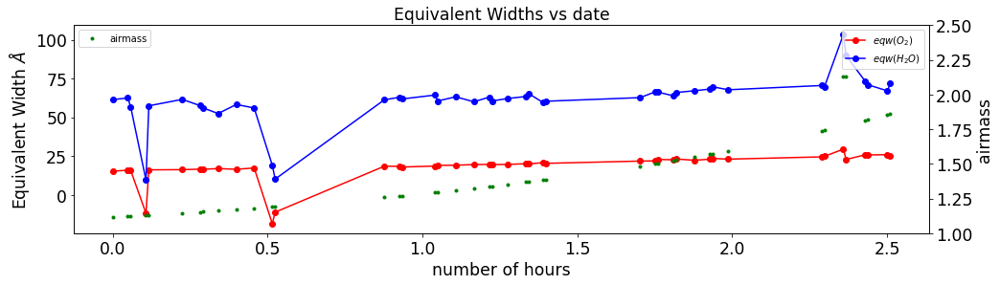

In [90]:
fig=plt.figure(figsize=(16,4))
#plt.xticks(rotation=90)
ax = fig.add_subplot(1, 1, 1)
ax.plot(df_infos['reftime'], df_infos['eqw_o2'],marker="o",color="red",label="$eqw(O_2)$");
ax.plot(df_infos['reftime'], df_infos['eqw_h2o'],marker="o",color="blue",label="$eqw(H_2O)$");
#ax.set_xticks(rotation='vertical');
#ax.xaxis.set_tick_params(rotation=90)
ax.set_xlabel("number of hours")
ax.legend(loc="upper right")
ax.set_ylabel("Equivalent Width $\AA$")
ax2 = ax.twinx()
ax2.plot(df_infos['reftime'], df_infos['airmass'],linestyle='dotted', marker='.',color="green",label="airmass",lw=0)
ax2.set_ylim(1,2.5)
ax2.legend(loc="upper left")
ax2.set_ylabel("airmass")
ax.set_title("Equivalent Widths vs date")